In [23]:
import warnings; warnings.filterwarnings('ignore')
from pathlib import Path
import numpy as np, pandas as pd, xarray as xr, scipy.io as sio
from scipy.spatial import cKDTree

%matplotlib inline
import matplotlib.pyplot as plt, matplotlib.path as mpath, matplotlib.patheffects as pe
import cartopy.crs as ccrs
from matplotlib.lines import Line2D
plt.rcParams['figure.dpi'] = 110

DATA = Path('/Users/advik/Library/Mobile Documents/com~apple~CloudDocs/Documents/'
            'Documents - MacBook Air/Python/Ice Cores/data/model/ccsm4_last_millenium')
AWS_MAT      = Path.home()/'Downloads'/'Mathieu'/'Data'/'dataAWS.mat'
ANT11        = Path.home()/'DataFiles'/'ANT11_masks.nc'
GROUNDED_NPY = Path.home()/'DataFiles'/'ANT11_grounded_mask.npy'
CORES_CSV    = Path.home()/'DataFiles'/'WaterCoresCoords.csv'

N_POT_RAW, N_EXIST = 5794, 118        # rows as they appear in every *Ye.mat
N_SITES_RAW = N_POT_RAW + N_EXIST     # constant; never reassigned

# (-66.44, 162.50) is the Balleny Islands: one isolated cell 378 km from its
# nearest neighbour. Dropping it takes max spacing from 378 km to 105 km.
EXCLUDE_SITES, EXCLUDE_TOL_KM = [(-66.44, 162.50)], 30.0

# ======================= TOGGLES =======================
ENSEMBLE       = 'MRE'      # 'MRE' (160 members) | 'MME' (1001)
VARIABLE       = 'Temp'
ACCUM_ENSEMBLE = 'MRE'      # accumulation source for R_ICE_CORE = k/A

METRIC_SOURCE        = 'computed'   # 'computed' | 'file'
METRIC_GROUNDED_ONLY = True
METRIC_AREA_WEIGHTED = True

# Exclude floating ice from the site set entirely, before Ye is ever sliced.
#   'imbie' -- ANT11 2-D grounded mask (correct; use this)
#   'moa'   -- IceShelfMask.csv, one grounding latitude per longitude. WRONG on
#              the Peninsula (flags 44/70 of its sites as floating) and it
#              collapses the AWS network from 16 cells to 14.
EXCLUDE_SHELF   = True
SHELF_SOURCE    = 'imbie'    # 'imbie' | 'moa'
# ANT11_grounded_mask.npy has 1-cell filaments across the Ronne/Ross at 63-100 m
# and isolated 2-7 cell specks at 107-188 m. Clean it, then require every site
# to lie within SHELF_RADIUS_KM of the cleaned mask. Mid-shelf CCSM4 cells sit
# 146-229 km away; every legitimate coastal site is within 51 km.
SHELF_ELEV_MAX  = 100.0      # m; 0 disables
MIN_ISLAND      = 10         # cells; 1 disables
SHELF_RADIUS_KM = 100.0
PROTECT_OBSERVED = True      # never drop a cell hosting an AWS or an existing core


# AWS observation error variance.
#   'per_station' -- triple collocation (station / ERA5 cell mean / RACMO cell
#                    mean, annual 1979-2024, floored at 0.02). No dataset is
#                    treated as truth. Includes point-vs-gridcell
#                    representativeness -- NOT instrument accuracy.
R_AWS_MODE  = 'per_station' # 'constant' | 'per_station'
R_AWS_CONST = 0.2
R_AWS_NEW   = 0.2           # R for a hypothetical NEW station
R_AWS_VALID = 0.05          # frozen: reproduces the reference table in cell 11
# =======================================================

R_AWS_TC_STATION = {        # station -> R (K^2)      raw TC / ERA5-as-truth
    'FaradayVernadsky': 0.731,   # TC +0.731   direct 0.745
    'Rothera':          0.674,   # TC +0.674   direct 0.614
    'Byrd':             0.363,   # TC +0.363   direct 0.362
    'Halley':           0.350,   # TC +0.350   direct 0.592
    'ScottBase':        0.301,   # TC +0.301   direct 0.410
    'AmundsenScott':    0.295,   # TC +0.295   direct 0.361
    'McMurdo':          0.288,   # TC +0.288   direct 0.327
    'Marambio':         0.228,   # TC +0.228   direct 0.406
    'Vostok':           0.215,   # TC +0.215   direct 0.369
    'DDU':              0.089,   # TC +0.089   direct 0.130
    'Novolazarevskaya': 0.087,   # TC +0.087   direct 0.599
    'Neumayer':         0.054,   # TC +0.054   direct 0.260
    'Bellingshausen':   0.038,   # TC +0.038   direct 0.037
    'Casey':            0.027,   # TC +0.027   direct 0.065
    'Davis':            0.027,   # TC +0.027   direct 0.056
    'Mirny':            0.023,   # TC +0.023   direct 0.052
    'Mawson':           0.020,   # TC +0.011   direct 0.039  (floored)
}
R_AWS_DEFAULT = 0.215

# Ice-core R = k/A. k from 42 replicate core pairs: sigma^2 = 2.202 per mil^2
# measured at A = 88.2 mm/yr.
D18O_TO_T, SIGMA2_D18O, A_CALIB = 2.0, 2.202, 88.2
N_BLOCKS, DEBLOCK_MRE = 4, True

def require(*names):
    """Fail loudly if a cell is run before its dependencies."""
    m = [n for n in names if n not in globals()]
    if m:
        raise RuntimeError(f'run the earlier cells first -- missing {m}')

print('DATA ok:', DATA.exists(), '| AWS ok:', AWS_MAT.exists())
print(f'ENSEMBLE={ENSEMBLE}  ACCUM_ENSEMBLE={ACCUM_ENSEMBLE}  '
      f'EXCLUDE_SHELF={EXCLUDE_SHELF}  R_AWS_MODE={R_AWS_MODE}')


DATA ok: True | AWS ok: True
ENSEMBLE=MRE  ACCUM_ENSEMBLE=MRE  EXCLUDE_SHELF=True  R_AWS_MODE=per_station


In [24]:
def read_numbers(p):
    o = []
    for t in Path(p).read_text().split():
        try: o.append(float(t))
        except ValueError: pass
    return np.asarray(o, float)

def haversine_km(a, b, c, d, Rk=6371.0088):
    a, b, c, d = map(np.radians, (a, b, c, d))
    h = np.sin((c-a)/2)**2 + np.cos(a)*np.cos(c)*np.sin((d-b)/2)**2
    return 2*Rk*np.arcsin(np.sqrt(np.clip(h, 0, 1)))

def deblock(X, nb=N_BLOCKS):
    """Remove each reanalysis's own mean. The MRE temperature METRIC carries a
    ~40 K ERA5 block offset the ESTIMATES do not: raw MRE J correlates 0.20
    with the spatial mean of its own Ye, and 0.95 once both are deblocked.
    Never applied to MME."""
    X = np.asarray(X, float)
    if X.shape[-1] % nb:
        raise ValueError(X.shape)
    return np.concatenate([b - b.mean(-1, keepdims=True)
                           for b in np.split(X, nb, axis=-1)], axis=-1)

def load_Ye_raw(variable=None, ensemble=None):
    """Full 5912-row estimate matrix from disk. Never sliced here."""
    variable = variable or VARIABLE; ensemble = ensemble or ENSEMBLE
    k = f'{variable}{ensemble}Ye'
    Ye = np.asarray(sio.loadmat(DATA / f'{k}.mat')[k], float)
    assert Ye.shape[0] == N_SITES_RAW, Ye.shape
    return deblock(Ye) if (ensemble == 'MRE' and DEBLOCK_MRE) else Ye

def load_file_metric(variable=None, ensemble=None):
    """{ENSEMBLE}{VARIABLE}.mat as shipped -- comparison only. NOT a spatial
    average of the estimates: 6.4 K colder than the land-site mean, corr 0.897,
    and no single CCSM4 cell exceeds 0.892."""
    variable = variable or VARIABLE; ensemble = ensemble or ENSEMBLE
    k = f'{ensemble}{variable}'
    Jf = np.asarray(sio.loadmat(DATA / f'{k}.mat')[k], float).ravel()
    return deblock(Jf) if (ensemble == 'MRE' and DEBLOCK_MRE) else Jf

def load_accum_raw(ensemble=None):
    """Site-mean accumulation, full 5912 rows. Follows ACCUM_ENSEMBLE."""
    k = f'Accum{ensemble or ACCUM_ENSEMBLE}Ye'
    return np.asarray(sio.loadmat(DATA / f'{k}.mat')[k], float).mean(1)

print('helpers defined (nothing loaded yet)')


helpers defined (nothing loaded yet)


In [25]:
require('DATA', 'haversine_km')
ccsm_lat = np.linspace(-90, 90, 192)
ccsm_lon = np.arange(288) * 1.25

def build_site_coords():
    era = xr.open_dataset(DATA / 'data.nc')
    t2m = era[list(era.data_vars)[0]].values
    tm = np.roll(t2m, 1800, axis=2)
    li = pd.read_csv(DATA / 'latInd.csv').values.ravel().astype(int)
    tr = np.zeros((32, 3600))
    for i, it in enumerate(li):
        tr[i, :] = tm[0, it]
    sec = np.zeros((32, 7200))
    for i in range(32):
        sec[i, :7198] = np.dstack((tr[i, :-1],
                                   tr[i, :-1] + np.diff(tr[i])/2.0)).ravel()
    rg = sec[:, ::25]
    la, lo = [], []
    for i in range(32):
        for j in range(288):
            if rg[i, j] > 0:
                la.append(ccsm_lat[i]); lo.append(ccsm_lon[j])
    return np.array(la), np.array(lo)

site_lat_raw, site_lon_raw = build_site_coords()
assert site_lat_raw.size == N_POT_RAW

drop = np.zeros(N_POT_RAW, bool)
for la, lo in EXCLUDE_SITES:
    drop |= haversine_km(la, np.mod(lo, 360.), site_lat_raw, site_lon_raw) < EXCLUDE_TOL_KM

# ANT11 lookup on the RAW coordinates, so the shelf mask can be applied before
# anything is sliced. Basins and topography come along for free.
_a11 = xr.open_dataset(ANT11)
_ice = _a11['Icesheet_Only'].values > 0.5
_aB  = _a11['Basins'].values[_ice]
_aT  = _a11['Topography'].values[_ice]
_aLA = _a11['lat'].values[_ice]
_aLO = np.mod(_a11['lon'].values, 360.)[_ice]
_aG  = np.load(GROUNDED_NPY)[_ice]

def to_xyz(la, lo):
    la, lo = np.radians(la), np.radians(lo)
    return np.stack([np.cos(la)*np.cos(lo), np.cos(la)*np.sin(lo), np.sin(la)], -1)

_dist, _idx = cKDTree(to_xyz(_aLA, _aLO)).query(to_xyz(site_lat_raw, site_lon_raw))
_km = 2*6371.0088*np.arcsin(np.clip(_dist/2, 0, 1))
gr_imbie_raw = _aG[_idx]; too_far_raw = _km > 150
basin_raw    = _aB[_idx]; elev_raw    = _aT[_idx]

_gl = pd.read_csv(DATA / 'IceShelfMask.csv')['Mask'].values.astype(float)
shelf_moa_raw = site_lat_raw > _gl[(np.round(site_lon_raw/1.25).astype(int)) % 288]

# --- clean the ANT11 grounded mask, then measure distance to it ---
from scipy import ndimage as _ndi
_gr_full   = np.load(GROUNDED_NPY)
_ice_full  = _a11['Icesheet_Only'].values > 0.5
_topo_full = _a11['Topography'].values
_Vf = _ice_full & (_gr_full > 0.5 if _gr_full.dtype != bool else _gr_full)
if SHELF_ELEV_MAX > 0:
    _Vf &= _topo_full > SHELF_ELEV_MAX
if MIN_ISLAND > 1:
    _lb, _nn = _ndi.label(_Vf, structure=np.ones((3, 3), bool))
    _szz = _ndi.sum(_Vf, _lb, range(1, _nn + 1))
    _Vf &= ~np.isin(_lb, np.flatnonzero(_szz < MIN_ISLAND) + 1)
_clat = _a11['lat'].values[_Vf]
_clon = np.mod(_a11['lon'].values, 360.)[_Vf]
_dc, _ = cKDTree(to_xyz(_clat, _clon)).query(to_xyz(site_lat_raw, site_lon_raw))
clean_km = 2*6371.0088*np.arcsin(np.clip(_dc/2, 0, 1))

if not EXCLUDE_SHELF:
    shelf_drop = np.zeros(N_POT_RAW, bool)
elif SHELF_SOURCE == 'imbie':
    shelf_drop = (~gr_imbie_raw) | too_far_raw | (clean_km > SHELF_RADIUS_KM)
elif SHELF_SOURCE == 'moa':
    shelf_drop = shelf_moa_raw
else:
    raise ValueError(SHELF_SOURCE)

# A real observation is proof the cell is drillable/standable: never drop it.
if EXCLUDE_SHELF and SHELF_SOURCE == 'imbie' and PROTECT_OBSERVED:
    _ob  = pd.read_csv(CORES_CSV, header=None, names=['name', 'alt', 'lat', 'lon'])
    _ola = _ob.lat.astype(float).values
    _olo = np.mod(_ob.lon.astype(float).values, 360.)
    _aw  = sio.loadmat(AWS_MAT, squeeze_me=True, struct_as_record=False)['dataAWS']
    for _n in _aw._fieldnames:
        _r = getattr(_aw, _n)
        _ola = np.append(_ola, float(_r.lat))
        _olo = np.append(_olo, np.mod(float(_r.lon), 360.))
    _pi = np.unique([int(np.argmin(haversine_km(a, b, site_lat_raw, site_lon_raw)))
                     for a, b in zip(_ola, _olo)])
    _resc = int(shelf_drop[_pi].sum()); shelf_drop[_pi] = False
    print(f'  protected {len(_pi)} observed cells, rescued {_resc}')


keep_pot = ~drop & ~shelf_drop            # the ONE mask everything else uses
site_lat, site_lon = site_lat_raw[keep_pot], site_lon_raw[keep_pot]
N_POTENTIAL = int(keep_pot.sum())

is_shelf            = shelf_moa_raw[keep_pot]     # reference only
site_grounded_imbie = gr_imbie_raw[keep_pot]
too_far             = too_far_raw[keep_pot]
site_basin          = basin_raw[keep_pot]
site_elev           = elev_raw[keep_pot]
grounded = np.ones(N_POTENTIAL, bool) if EXCLUDE_SHELF else ~is_shelf
wts = np.cos(np.deg2rad(site_lat))

print(f'EXCLUDE_SHELF={EXCLUDE_SHELF} ({SHELF_SOURCE}): dropped '
      f'{int(shelf_drop.sum())} floating + {int(drop.sum())} named '
      f'-> N_POTENTIAL {N_POT_RAW} -> {N_POTENTIAL}')
print(f'  elevation {site_elev.min():.0f}-{site_elev.max():.0f} m, '
      f'median {np.median(site_elev):.0f} m')


  protected 77 observed cells, rescued 9
EXCLUDE_SHELF=True (imbie): dropped 499 floating + 1 named -> N_POTENTIAL 5794 -> 5295
  elevation 7-4072 m, median 2644 m


In [26]:
require('site_lat', 'N_POTENTIAL', 'site_basin', 'site_elev')

REGIONS = {'EAIS': [2, 4, 5, 7, 9, 12, 13, 14, 15, 17],
           'WAIS': [1, 18, 20, 21, 23],
           'AP':   [24, 25, 27]}
region_mask = {rn: (np.isin(site_basin, ids) & site_grounded_imbie & ~too_far)
               for rn, ids in REGIONS.items()}

# --- PAGES Ant-2K regions (Stenni et al. 2017), port of regions_Ant2K.m ---
PLATEAU_ALTI, PENI, WED, B_AI = 2000.0, -74.0, 330.0, 67.0
_VIC = """-85 150
-84 150
-83 149
-82 148
-81 147
-80 149
-79 150
-78 150
-77 150
-76 155
-75 160
-74 160
-73 160
-72 160
-71 160
-70 160
-69 160
-68 160
-67 160
-66 160
-65 160
-64 160
-63 160"""
vic_tab = np.array([[float(x) for x in l.split()] for l in _VIC.strip().splitlines()])
vic_ord = np.argsort(vic_tab[:, 0])
lats_v, vlim = vic_tab[vic_ord, 0], vic_tab[vic_ord, 1]

def regions_ant2k(lat, lon, elevi, edml_zero=False):
    """Rules applied in order, later ones overwriting -- as in the MATLAB.
    edml_zero=True reproduces the original's region-0 bug; False is the fix."""
    lat = np.asarray(lat, float); lon = np.asarray(lon, float)
    elevi = np.asarray(elevi, float); sh = lat.shape
    vlat = lat.ravel(); vlon = np.mod(lon.ravel(), 360.); ve = elevi.ravel()
    reg = np.full(vlat.shape, np.nan)
    vll = np.interp(vlat, lats_v, vlim, left=np.nan, right=np.nan)
    with np.errstate(invalid='ignore'):
        reg[(vlon < 145) & (ve > PLATEAU_ALTI)] = 1
        reg[(vlon >= 145) & (vlon < 190) & (ve >= 0) & (vlon < vll)] = 1
        reg[(vlon >= 145) & (vlon < 350) & (vlat < -84) & (ve >= 0)] = 1
        f = 0. if edml_zero else 1.
        reg[(vlon < 30) & (ve > PLATEAU_ALTI)] = f
        reg[(vlon >= 300) & (ve > PLATEAU_ALTI)] = f
        reg[(vlon > WED) & (ve < PLATEAU_ALTI) & (vlat > -76) & (ve >= 0)] = 7
        reg[(vlon > 0) & (vlon < B_AI) & (ve < PLATEAU_ALTI)] = 7
        reg[(vlon > WED) & (ve < PLATEAU_ALTI) & (vlat < -75) & (ve >= 0)] = 3
        reg[(vlon >= 300) & (vlon < WED) & (ve < PLATEAU_ALTI)] = 3
        reg[(vlon >= B_AI) & (vlon < 145) & (ve < PLATEAU_ALTI)] = 2
        reg[(vlon >= 145) & (vlon < 160) & (ve >= 0) & (vlon < vll)
            & (ve < PLATEAU_ALTI) & (vlat > -72)] = 2
        reg[(vlon >= 145) & (vlon < 190) & (ve >= 0) & (vlat < -74) & (vlon > vll)] = 6
        reg[(vlon >= 160) & (vlon < 190) & (ve >= 0) & (vlon > vll)] = 6
        reg[(vlon >= 190) & (vlon < 280) & (vlat > -85) & (ve >= 0)] = 5
        reg[(vlon >= 280) & (vlon < 300) & (vlat > -85) & (vlat < PENI+.5) & (ve >= 0)] = 5
        reg[(vlon >= 280) & (vlon < 305) & (vlat > PENI) & (ve >= 0)] = 4
    return reg.reshape(sh)

P2K_NAMES = {1: 'East Antarctic Plateau', 2: 'Wilkes Land Coast',
             3: 'Weddell Sea Coast', 4: 'Antarctic Peninsula', 5: 'WAIS',
             6: 'Victoria Land / Ross Sea', 7: 'Dronning Maud Land Coast'}
SHORT = ['Plateau', 'Wilkes', 'Weddell', 'Peninsula', 'WAIS', 'Vic.Land/Ross', 'DML']
site_region = regions_ant2k(site_lat, site_lon, site_elev, edml_zero=False)
p2k_mask = {v: ((site_region == v) & site_grounded_imbie & ~too_far)
            for v in range(1, 8)}
print(f'{"region":32s} {"sites":>6s} {"weight":>8s}')
for v, nm in P2K_NAMES.items():
    print(f'{v} {nm:30s} {p2k_mask[v].sum():6d} '
          f'{100*wts[p2k_mask[v]].sum()/wts.sum():7.1f}%')


region                            sites   weight
1 East Antarctic Plateau           3677    58.7%
2 Wilkes Land Coast                 183     7.8%
3 Weddell Sea Coast                 272     4.8%
4 Antarctic Peninsula                70     2.7%
5 WAIS                              767    16.1%
6 Victoria Land / Ross Sea          145     3.2%
7 Dronning Maud Land Coast          157     6.0%


In [27]:
require('site_lat', 'is_shelf')
_aws = sio.loadmat(AWS_MAT, squeeze_me=True, struct_as_record=False)['dataAWS']
rows = []
for n_ in _aws._fieldnames:
    r = getattr(_aws, n_)
    la, lo = float(r.lat), np.mod(float(r.lon), 360.0)
    d = haversine_km(la, lo, site_lat, site_lon); k = int(np.argmin(d))
    rows.append(dict(station=n_, lat=la, lon=lo, site=k, km=d[k]))
aws_map = pd.DataFrame(rows)
AWS_SITES = sorted(set(aws_map.site))
print(f'{len(aws_map)} stations -> {len(AWS_SITES)} cells, '
      f'max offset {aws_map.km.max():.0f} km')
aws_map.round(1)


17 stations -> 16 cells, max offset 125 km


,station,lat,lon,site,km
0,FaradayVernadsky,-65.1,295.8,5286,43.9
1,Rothera,-67.3,291.9,5258,25.3
2,Byrd,-80.0,240.7,3128,43.3
3,Marambio,-64.2,303.4,5293,124.9
4,Mawson,-67.6,62.9,5137,82.3
5,Davis,-68.6,78.0,5144,43.3
6,McMurdo,-77.9,166.7,3554,25.2
7,DDU,-66.7,140.0,5253,75.9
8,Bellingshausen,-62.1,301.4,5294,95.4
9,Neumayer,-70.4,351.8,4910,86.3


In [28]:
require('site_lat', 'grounded', 'keep_pot')

def build_metric(Ye, mask=None, weights=None):
    """cos(lat)-weighted spatial mean of the estimates over `mask`.

    Verified against exact spherical-band cell areas: identical to 4 decimals
    (corr 1.00000). Unweighted averaging is NOT equivalent (corr 0.961) -- the
    288 sites at exactly -90 are the same physical point."""
    Y = Ye[:N_POTENTIAL]
    m = np.ones(N_POTENTIAL, bool) if mask is None else np.asarray(mask, bool)
    if weights is None:
        w = np.cos(np.deg2rad(site_lat)) if METRIC_AREA_WEIGHTED \
            else np.ones(N_POTENTIAL)
    else:
        w = np.asarray(weights, float)
    w = w[m]
    return (Y[m] * w[:, None]).sum(0) / w.sum()

def set_ensemble(ens=None):
    """Rebuild every ensemble-dependent array FROM DISK. Idempotent."""
    global ENSEMBLE, Ye, nM, unbias, J, J_computed, J_file, J0var
    global accum_rate, R_ICE_CORE, metric_mask, ENS_STAMP
    if ens is not None:
        ENSEMBLE = ens
    raw = load_Ye_raw()
    Ye  = np.concatenate([raw[:N_POT_RAW][keep_pot], raw[N_POT_RAW:]])
    nM, unbias = Ye.shape[1], 1/(Ye.shape[1] - 1)
    metric_mask = grounded if METRIC_GROUNDED_ONLY else np.ones(N_POTENTIAL, bool)
    J_computed  = build_metric(Ye, mask=metric_mask)
    J_file      = load_file_metric()
    J = J_computed if METRIC_SOURCE == 'computed' else J_file
    J0var = unbias * ((J - J.mean())**2).sum()
    accum_rate = load_accum_raw()[:N_POT_RAW][keep_pot]
    R_ICE_CORE = D18O_TO_T**2 * SIGMA2_D18O * A_CALIB / accum_rate
    ENS_STAMP = (ENSEMBLE, VARIABLE, METRIC_SOURCE, ACCUM_ENSEMBLE, nM, Ye.shape)
    print(f'ENSEMBLE={ENSEMBLE}  VARIABLE={VARIABLE}  METRIC_SOURCE={METRIC_SOURCE}')
    print(f'  Ye {Ye.shape}   nM {nM}   DOF {nM-1}   '
          f'deblock={"on" if ENSEMBLE=="MRE" and DEBLOCK_MRE else "off"}')
    print(f'  J: mean {J.mean():.3f} K   sd {J.std(ddof=1):.4f} K   var {J0var:.5f}')
    print(f'  accum Accum{ACCUM_ENSEMBLE}Ye.mat -> R_ICE_CORE median '
          f'{np.median(R_ICE_CORE):.2f} K^2, range {R_ICE_CORE.min():.2f}'
          f' .. {R_ICE_CORE.max():.1f}')
    return ENS_STAMP

def check_ens():
    """First line of every analysis cell. Turns silent drift into an error."""
    want = (ENSEMBLE, VARIABLE, METRIC_SOURCE, ACCUM_ENSEMBLE, nM, Ye.shape)
    if ENS_STAMP != want:
        raise RuntimeError(f'stale state: arrays built as {ENS_STAMP}, config '
                           f'now says {want}. Re-run set_ensemble().')

set_ensemble()


ENSEMBLE=MRE  VARIABLE=Temp  METRIC_SOURCE=computed
  Ye (5413, 160)   nM 160   DOF 159   deblock=on
  J: mean 0.000 K   sd 0.5529 K   var 0.30568
  accum AccumMREYe.mat -> R_ICE_CORE median 10.81 K^2, range 0.32 .. 47.9


('MRE', 'Temp', 'computed', 'MRE', 160, (5413, 160))

In [29]:
TINY = 1e-12

def variance_reduction(Jdev, Ydev, Rvar, unb):
    den = unb * (Ydev**2).sum(1) + Rvar
    num = (unb * (Ydev @ Jdev))**2
    return np.where(den > TINY, num / np.where(den > TINY, den, 1.0), 0.0)

def adjusted_gain(Kn, Kd, Rb):
    ks = np.sqrt(Kd); return Kn / ks / (ks + np.sqrt(Rb))

class OptimalSensor:
    """DASH @optimalSensor (Comboul et al. 2015)."""
    def __init__(self, J, Ye, R):
        J = np.asarray(J, float).ravel()
        self.nM = J.size; self.unbias = 1/(self.nM - 1)
        self.Jdev = J - J.mean()
        Ye = np.asarray(Ye, float)
        self.Ydev = Ye - Ye.mean(1, keepdims=True)
        self.R = (np.full(Ye.shape[0], float(R)) if np.isscalar(R)
                  else np.asarray(R, float).ravel().copy())
        self.J0var = self.metric_variance()

    def metric_variance(self):
        return self.unbias * (self.Jdev**2).sum()

    def evaluate(self):
        return variance_reduction(self.Jdev, self.Ydev, self.R, self.unbias)

    def assimilate(self, i, Rval=None):
        Yb = self.Ydev[i].copy()
        Rb = self.R[i] if Rval is None else Rval
        Yv = self.unbias * (Yb**2).sum()
        if Yv + Rb <= TINY:
            self.Ydev[i] = np.nan
            return self.metric_variance()
        Ka = adjusted_gain(self.unbias * (self.Jdev @ Yb), Yv + Rb, Rb)
        self.Jdev = self.Jdev - Ka*Yb
        self.Ydev = self.Ydev - Ka*Yb
        self.Ydev[i] = np.nan
        return self.metric_variance()

print('OptimalSensor defined')


OptimalSensor defined


In [30]:
require('aws_map', 'AWS_SITES')

def build_R_aws():
    """R_aws(site) -> observation error variance for that AWS cell.
    Two stations sharing a CCSM4 cell (McMurdo/Scott Base) are averaged."""
    t = aws_map.assign(R=aws_map.station.map(R_AWS_TC_STATION))
    site_R = {int(k): float(v) for k, v in
              t.dropna(subset=['R']).groupby('site').R.mean().items()}
    if R_AWS_MODE == 'per_station':
        f = lambda i: site_R.get(int(i), R_AWS_DEFAULT)
    elif R_AWS_MODE == 'constant':
        f = lambda i: R_AWS_CONST
    else:
        raise ValueError(R_AWS_MODE)
    return f, site_R

R_aws, R_AWS_SITE = build_R_aws()
print(f'R_AWS_MODE = {R_AWS_MODE}' +
      (f'   R = {R_AWS_CONST} for all {len(AWS_SITES)} cells'
       if R_AWS_MODE == 'constant' else
       f'   {len(R_AWS_SITE)}/{len(AWS_SITES)} cells from the TC table'))


R_AWS_MODE = per_station   16/16 cells from the TC table


In [31]:
require('site_lat')
cc = pd.read_csv(CORES_CSV, header=None, names=['name', 'alt', 'lat', 'lon'])
cc['lat'] = cc.lat.astype(float)
cc['lon'] = np.mod(cc.lon.astype(float), 360.)
_d = np.array([haversine_km(a, b, site_lat, site_lon) for a, b in zip(cc.lat, cc.lon)])
cc['site'] = _d.argmin(1); cc['km'] = _d.min(1)
CORE_SITES = sorted(set(cc.site))
core_mask = np.zeros(N_POTENTIAL, bool); core_mask[CORE_SITES] = True
name_of = {}
for s_, n_ in zip(cc.site, cc.name):
    name_of.setdefault(int(s_), n_)
print(f'{len(cc)} existing cores -> {len(CORE_SITES)} unique cells '
      f'(median offset {cc.km.median():.0f} km)')


80 existing cores -> 63 unique cells (median offset 27 km)


In [32]:
check_ens()
_ky, _kj = f'{VARIABLE}{ENSEMBLE}Ye', f'{ENSEMBLE}{VARIABLE}'
Ye_raw = np.asarray(sio.loadmat(DATA / f'{_ky}.mat')[_ky], float)
J_raw  = np.asarray(sio.loadmat(DATA / f'{_kj}.mat')[_kj], float).ravel()
tgt    = read_numbers(DATA / f'BS_{ENSEMBLE}_{VARIABLE.lower()}_accumR.csv')
dv_chk = OptimalSensor(J_raw, Ye_raw[:N_POT_RAW],
                       read_numbers(DATA / 'RSheet.csv')[:N_POT_RAW]).evaluate()
corr = np.corrcoef(dv_chk, tgt)[0, 1]
rel  = np.max(np.abs(dv_chk - tgt) / np.maximum(np.abs(tgt), 1e-30))
print(f'algorithm check: 1 - corr {1-corr:.3e}   max rel err {rel:.3e}')
assert corr > 1 - 1e-8 and rel < 1e-3, 'does not match MATLAB'
print('matches the MATLAB output to the precision of the reference file')


algorithm check: 1 - corr 1.289e-10   max rel err 4.894e-05
matches the MATLAB output to the precision of the reference file


In [33]:
check_ens(); require('p2k_mask', 'AWS_SITES')
rows = []
for lbl, Jm in ([('AIS-wide', J)] +
                [(f'{v}. {P2K_NAMES[v]}', build_metric(Ye, mask=p2k_mask[v]))
                 for v in range(1, 8)]):
    ob = OptimalSensor(Jm, Ye[:N_POTENTIAL], R_ICE_CORE)
    J0m = ob.J0var
    for i in AWS_SITES:
        ob.assimilate(int(i), Rval=R_AWS_VALID)          # FROZEN, not R_aws
    v0m = ob.metric_variance()
    rows.append(dict(metric=lbl, var=J0m, remaining=v0m,
                     constrained_pct=100*(1 - v0m/J0m)))
REG = pd.DataFrame(rows)
print(f'FROZEN VALIDATION at R = {R_AWS_VALID}, {nM} members, '
      f'EXCLUDE_SHELF={EXCLUDE_SHELF}\n')
print(REG.round(4).to_string(index=False))

REF = {False: [92.4395, 92.0159, 92.8527, 58.5090, 80.6740, 85.8140, 78.9853, 89.0512],
       True:  [92.4946, 92.0159, 92.8527, 58.1998, 80.6740, 85.8563, 78.8332, 89.0512]}

ref = REF.get(bool(EXCLUDE_SHELF)) if SHELF_SOURCE == 'imbie' else None
if ref is None:
    print('\nno frozen reference for this configuration -- skipping the check')
else:
    ok = np.allclose(REG.constrained_pct.values, ref, atol=1e-3)
    print(f'\nregression vs reference: {"PASS" if ok else "FAIL"}')
    assert ok, 'notebook no longer reproduces the reference table'


FROZEN VALIDATION at R = 0.05, 160 members, EXCLUDE_SHELF=True

                     metric    var  remaining  constrained_pct
                   AIS-wide 0.3057     0.0229          92.4946
  1. East Antarctic Plateau 0.4244     0.0339          92.0159
       2. Wilkes Land Coast 0.4651     0.0332          92.8527
       3. Weddell Sea Coast 0.6074     0.2539          58.1998
     4. Antarctic Peninsula 0.7379     0.1426          80.6740
                    5. WAIS 0.5487     0.0776          85.8563
6. Victoria Land / Ross Sea 0.4913     0.1040          78.8332
7. Dronning Maud Land Coast 0.3197     0.0350          89.0512

regression vs reference: PASS


In [34]:
check_ens(); require('site_lat', 'aws_map')
SP, PL = ccrs.SouthPolarStereo(), ccrs.PlateCarree()
CMAP = plt.cm.Greens

LAT32 = ccsm_lat[:32]
_gi = np.searchsorted(LAT32, site_lat)
_gj = (np.round(site_lon/1.25).astype(int)) % 288
assert np.allclose(LAT32[_gi], site_lat) and np.allclose(ccsm_lon[_gj], site_lon), \
    'grid index mapping is wrong'
_dlat = np.diff(LAT32).mean()
LAT_E = np.concatenate([LAT32 - _dlat/2, [LAT32[-1] + _dlat/2]])
LON_E = np.concatenate([ccsm_lon - 0.625, [ccsm_lon[-1] + 0.625]])

def to_grid(v):
    v = np.asarray(v, float)
    if v.size != N_POTENTIAL:
        raise ValueError(f'expected {N_POTENTIAL} values, got {v.size} -- '
                         'this array is not a per-site field')
    g = np.full((32, 288), np.nan); g[_gi, _gj] = v
    return g

def polar_ax(ax):
    ax.set_extent([-180, 180, -90, -60], PL)
    th = np.linspace(0, 2*np.pi, 200)
    ax.set_boundary(mpath.Path(np.stack([np.cos(th), np.sin(th)], 1)*.5+.5),
                    transform=ax.transAxes)
    ax.gridlines(linewidth=.3, color='0.7'); ax.coastlines(linewidth=.7)

def field_map(pct, title, ax=None, fig=None, vmax=None, show_aws=False,
              cb=True, fs=12):
    if ax is None:
        fig = plt.figure(figsize=(11, 10)); ax = plt.axes(projection=SP)
    polar_ax(ax)
    vmax = float(np.nanmax(pct)) if vmax is None else vmax
    sc = ax.pcolormesh(LON_E, LAT_E, np.ma.masked_invalid(to_grid(pct)),
                       cmap=CMAP, vmin=0, vmax=vmax, transform=PL, zorder=1,
                       shading='flat')
    if show_aws:
        ax.scatter(aws_map.lon, aws_map.lat, marker='^', s=55, c='red',
                   edgecolors='k', lw=.5, transform=PL, zorder=3)
    if cb:
        c = fig.colorbar(sc, ax=ax, shrink=.62, pad=.04)
        c.set_label('% of total variance constrained')
    ax.set_title(title, fontsize=fs)
    return sc

print('plot helpers ready')


plot helpers ready


In [35]:
check_ens(); require('regions_ant2k', 'SP')
from scipy import ndimage as ndi

# ANT11_grounded_mask.npy has two defects:
#  (1) 1-cell-wide filaments of "grounded" cells running ACROSS the Ronne and
#      along the southern Ross front, at 63-100 m -- ice-shelf elevations
#      (shelf median 57 m) whereas real ice rises are far higher: Berkner
#      673-800, Siple Dome 360-550, Roosevelt 70-262.
#  (2) isolated 2-7 cell specks inside both shelves at 107-188 m.
# An elevation floor fixes (1); a minimum component size fixes (2). Real ice
# rises survive both: Berkner 356 cells, Roosevelt 51, Ross Island 21.
SHELF_ELEV_MAX = 100.0     # metres; 0 disables
MIN_ISLAND     = 10        # cells; 1 disables

_d2    = xr.open_dataset(ANT11)
_lat2  = _d2['lat'].values
_lon2  = np.mod(_d2['lon'].values, 360.)
_topo2 = _d2['Topography'].values
_ice2  = _d2['Icesheet_Only'].values > 0.5
_gr2   = np.load(GROUNDED_NPY)
BND_VALID = _ice2 & (_gr2 > 0.5 if _gr2.dtype != bool else _gr2)
_n0 = int(BND_VALID.sum())

if SHELF_ELEV_MAX > 0:
    BND_VALID &= _topo2 > SHELF_ELEV_MAX
_n1 = int(BND_VALID.sum())

if MIN_ISLAND > 1:
    _lab, _n = ndi.label(BND_VALID, structure=np.ones((3, 3), bool))
    _sz = ndi.sum(BND_VALID, _lab, range(1, _n + 1))
    BND_VALID &= ~np.isin(_lab, np.flatnonzero(_sz < MIN_ISLAND) + 1)
_n2 = int(BND_VALID.sum())

BND_REG = regions_ant2k(_lat2, _lon2, _topo2, edml_zero=False)
BND_REG = np.where(BND_VALID, BND_REG, np.nan)

# contour in projected coordinates so the 0/360 seam cannot create artifacts
_XY = SP.transform_points(PL, _lon2, _lat2)
BND_X, BND_Y = _XY[:, :, 0], _XY[:, :, 1]

REG_FILL, REG_EDGE = '#ffcc80', '#e08214'

def outline_region(ax, v, lw=1.3):
    """Outline region v (v=0 -> all grounded ice). No fill, no other regions."""
    Z = np.nan_to_num(np.where(BND_VALID,
                               ((BND_REG == v) if v else BND_VALID).astype(float), 0.0))
    ax.contour(BND_X, BND_Y, Z, levels=[0.5], colors=[REG_EDGE], linewidths=lw,
               transform=SP, zorder=5)

def fill_region(ax, v):
    """Shade region v underneath everything else (v=0 -> all grounded ice)."""
    Z = np.nan_to_num(np.where(BND_VALID,
                               ((BND_REG == v) if v else BND_VALID).astype(float), 0.0))
    ax.contourf(BND_X, BND_Y, Z, levels=[0.5, 1.5], colors=[REG_FILL],
                alpha=.9, transform=SP, zorder=1)
    ax.contour(BND_X, BND_Y, Z, levels=[0.5], colors=[REG_EDGE], linewidths=1.1,
               transform=SP, zorder=1.5)

_lab, _ncomp = ndi.label(BND_VALID, structure=np.ones((3, 3), bool))
print(f'ANT11 grounded cells {_n0} -> {_n1} (elev > {SHELF_ELEV_MAX:.0f} m) '
      f'-> {_n2} (components >= {MIN_ISLAND} cells);  {_ncomp} components remain')
for v in range(1, 8):
    print(f'  {v}. {P2K_NAMES[v]:28s} {int(np.nansum(BND_REG == v)):7d} cells')
print('unassigned grounded cells:',
      int((BND_VALID & ~np.isin(np.nan_to_num(BND_REG, nan=-1),
                                list(range(1, 8)))).sum()))


ANT11 grounded cells 101022 -> 99647 (elev > 100 m) -> 99543 (components >= 10 cells);  13 components remain
  1. East Antarctic Plateau         59014 cells
  2. Wilkes Land Coast               7822 cells
  3. Weddell Sea Coast               4883 cells
  4. Antarctic Peninsula             2093 cells
  5. WAIS                           16210 cells
  6. Victoria Land / Ross Sea        3475 cells
  7. Dronning Maud Land Coast        6046 cells
unassigned grounded cells: 0


--- blank slate: one new ICE CORE, R = k/A ---
                     metric  max_pct    lat    lon   accum    R  in_region  mean_pct
                   AIS-wide    28.35 -66.44 113.75 1666.42 0.47       True      4.59
  1. East Antarctic Plateau    27.52 -67.38  98.75  682.70 1.14      False      4.13
       2. Wilkes Land Coast    41.94 -66.44 113.75 1666.42 0.47       True      4.34
       3. Weddell Sea Coast    26.78 -78.69 313.75  321.94 2.41       True      1.69
     4. Antarctic Peninsula    55.16 -71.15 287.50  980.93 0.79       True      1.86
                    5. WAIS    45.90 -74.92 228.75 1341.49 0.58       True      3.69
6. Victoria Land / Ross Sea    21.23 -66.44  55.00 1248.17 0.62      False      2.08
7. Dronning Maud Land Coast    28.85 -68.32  70.00  708.61 1.10      False      3.68


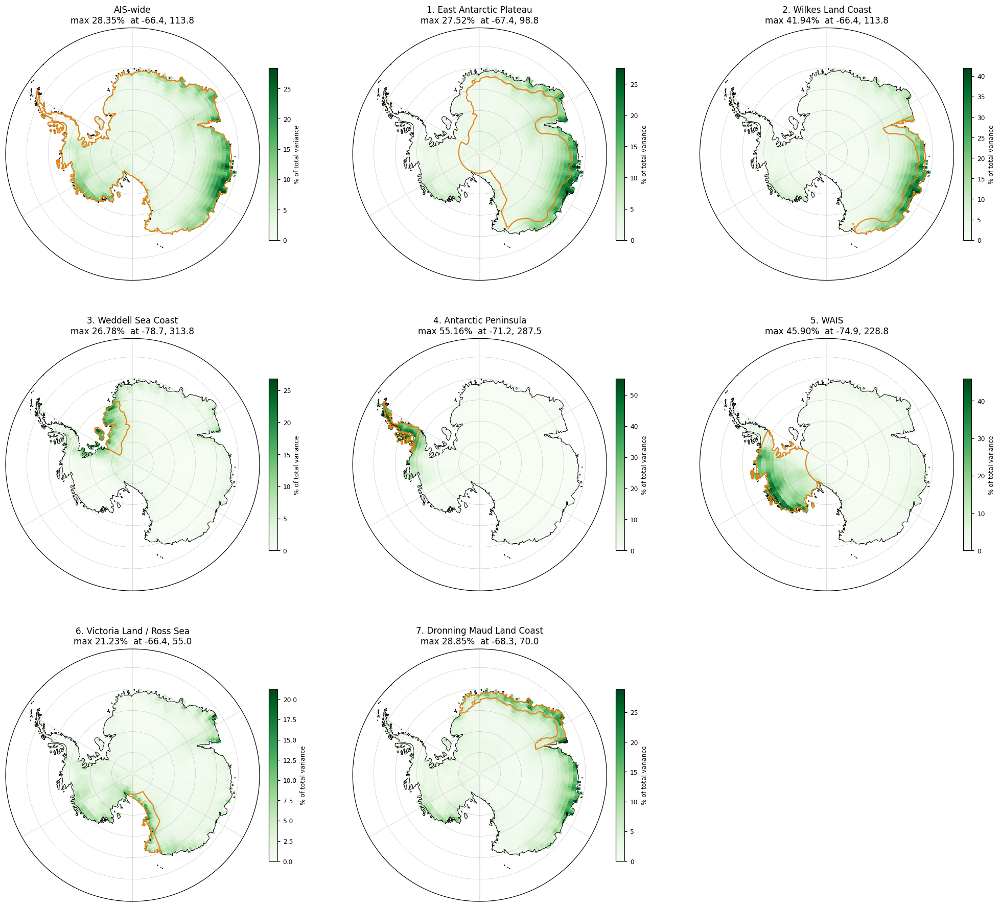

In [36]:
check_ens(); require('outline_region', 'field_map')

# the 8 metrics used throughout: AIS plus the 7 PAGES regions
METS = ([('AIS-wide', J, 0)] +
        [(f'{v}. {P2K_NAMES[v]}', build_metric(Ye, mask=p2k_mask[v]), v)
         for v in range(1, 8)])

def blank_panels(Rcand, label):
    """Blank slate: nothing assimilated. One candidate observation at each grid
    cell, scored as a percentage of the metric's TOTAL variance."""
    fig = plt.figure(figsize=(19, 17)); rows = []
    for idx, (lbl, Jm, v) in enumerate(METS):
        ob = OptimalSensor(Jm, Ye[:N_POTENTIAL], Rcand)
        p = 100 * ob.evaluate() / ob.J0var
        k = int(np.nanargmax(p))
        r_, c_ = divmod(idx, 3)
        ax = fig.add_axes([0.02 + c_*0.325, 0.68 - r_*0.325, 0.29, 0.29],
                          projection=SP)
        sc = field_map(p, f'{lbl}\nmax {p[k]:.2f}%  at '
                          f'{site_lat[k]:.1f}, {site_lon[k]:.1f}',
                       ax=ax, fig=fig, cb=False, fs=11)
        outline_region(ax, v)
        cb = fig.colorbar(sc, ax=ax, shrink=.62, pad=.03)
        cb.ax.tick_params(labelsize=8)
        cb.set_label('% of total variance', fontsize=8)
        rows.append(dict(metric=lbl, max_pct=p[k], lat=site_lat[k], lon=site_lon[k],
                         accum=accum_rate[k],
                         R=(Rcand[k] if np.ndim(Rcand) else Rcand),
                         in_region=(bool(p2k_mask[v][k]) if v else True),
                         mean_pct=(p*wts).sum()/wts.sum()))
    print(f'--- {label} ---')
    print(pd.DataFrame(rows).round(2).to_string(index=False))
    plt.show()

blank_panels(R_ICE_CORE, 'blank slate: one new ICE CORE, R = k/A')


--- blank slate: one new AWS, R = 0.2 ---
                     metric  max_pct    lat    lon  accum   R  in_region  mean_pct
                   AIS-wide    57.79 -76.81 132.50  22.20 0.2       True     34.29
  1. East Antarctic Plateau    67.18 -81.52  56.25  20.92 0.2       True     34.31
       2. Wilkes Land Coast    67.17 -68.32  98.75 397.41 0.2       True     26.95
       3. Weddell Sea Coast    79.93 -79.63 337.50  88.73 0.2       True     13.51
     4. Antarctic Peninsula    78.60 -72.09 288.75 609.15 0.2       True      4.40
                    5. WAIS    72.69 -81.52 237.50 115.57 0.2       True     14.43
6. Victoria Land / Ross Sea    73.32 -79.63 156.25 119.38 0.2       True     17.89
7. Dronning Maud Land Coast    61.00 -72.09  35.00 118.89 0.2      False     27.23


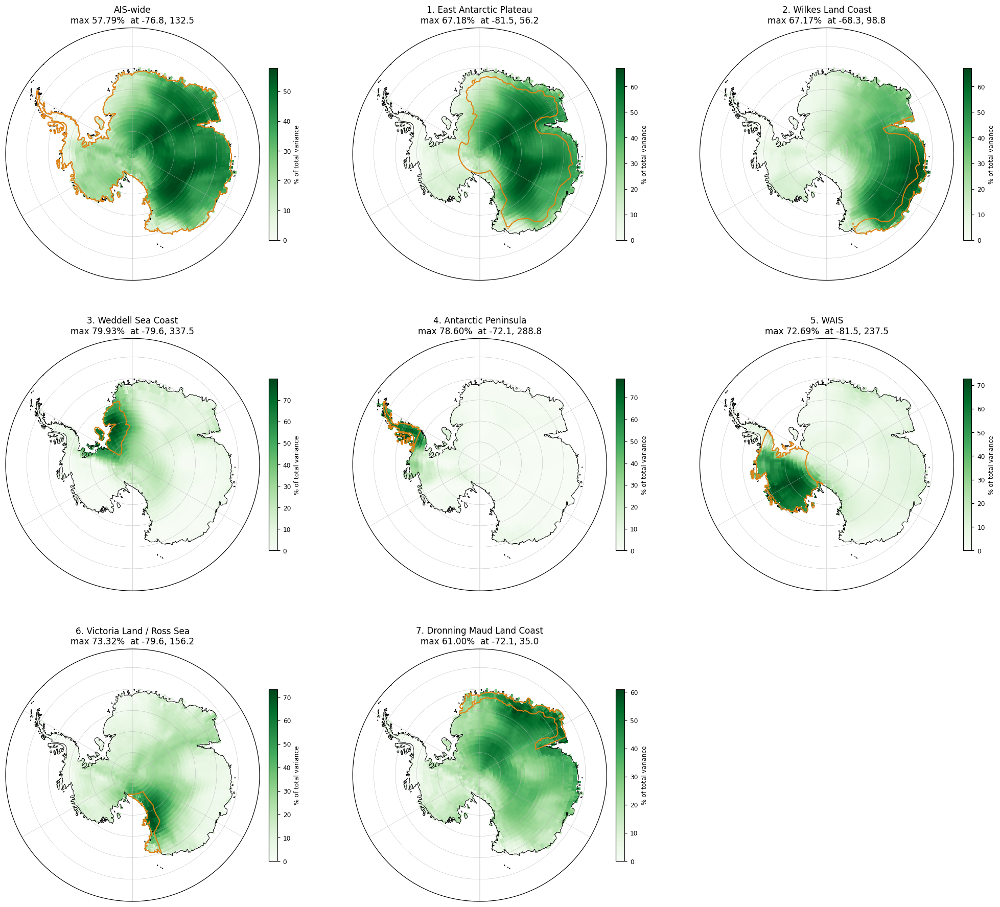

In [37]:
check_ens(); require('blank_panels')
blank_panels(R_AWS_NEW, f'blank slate: one new AWS, R = {R_AWS_NEW}')


--- after AWS assimilation: one new ICE CORE, R = k/A ---
                     metric  aws_base  max_add    lat    lon   accum    R  in_region  mean_add
                   AIS-wide     88.90     0.55 -74.92 282.50  672.01 1.16       True      0.07
  1. East Antarctic Plateau     87.54     0.59 -73.98 241.25 1148.44 0.68      False      0.05
       2. Wilkes Land Coast     91.69     1.05 -68.32 145.00  587.87 1.32       True      0.06
       3. Weddell Sea Coast     49.90     9.08 -78.69 313.75  321.94 2.41       True      0.30
     4. Antarctic Peninsula     68.96     9.88 -71.15 290.00  977.24 0.79       True      0.27
                    5. WAIS     71.68     6.35 -73.98 241.25 1148.44 0.68       True      0.33
6. Victoria Land / Ross Sea     72.11     1.57 -78.69 162.50  295.38 2.63       True      0.10
7. Dronning Maud Land Coast     89.66     0.92 -69.27  35.00 1068.15 0.73       True      0.04


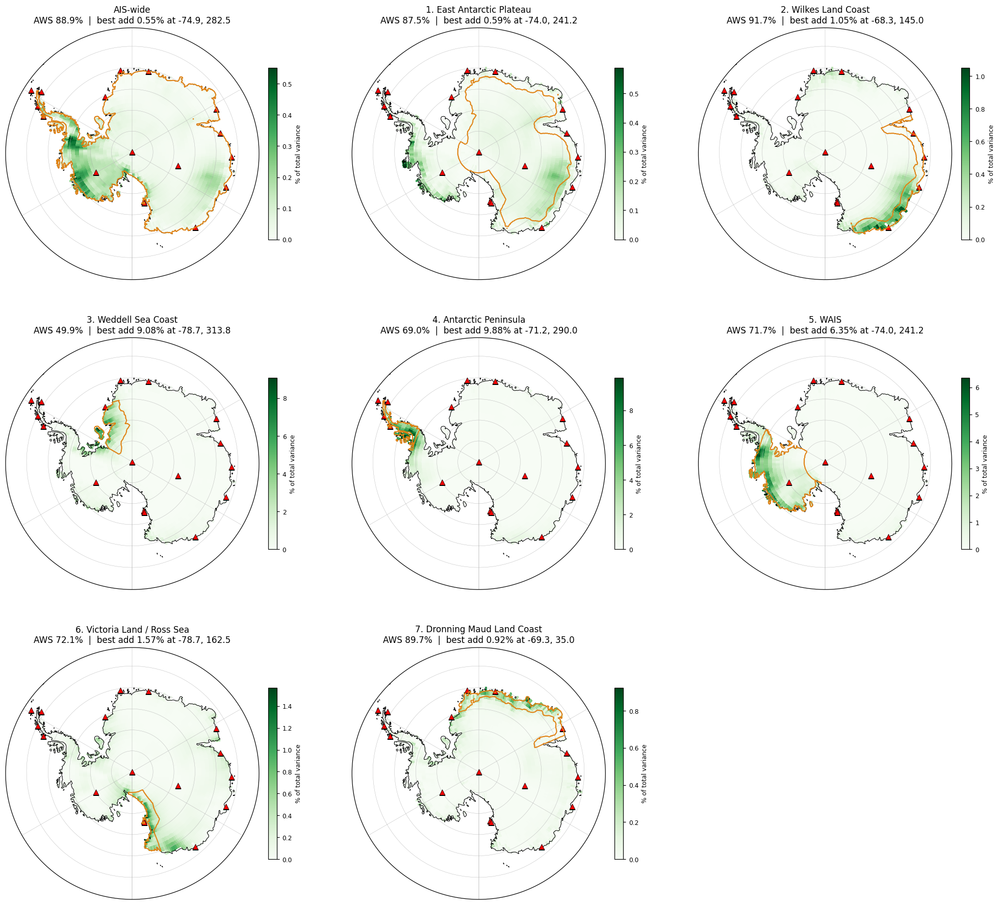

In [38]:
check_ens(); require('outline_region', 'field_map', 'METS')

def post_aws_panels(Rcand, label):
    """The AWS network is assimilated first, then one candidate observation is
    scored at each grid cell. Values are percentage points of the metric's
    TOTAL variance -- i.e. what this observation ADDS to the AWS baseline."""
    fig = plt.figure(figsize=(19, 17)); rows = []
    for idx, (lbl, Jm, v) in enumerate(METS):
        ob = OptimalSensor(Jm, Ye[:N_POTENTIAL], Rcand)
        J0m = ob.J0var
        for i in AWS_SITES:
            ob.assimilate(int(i), Rval=R_aws(i))
        base = 100 * (1 - ob.metric_variance() / J0m)
        p = 100 * np.where(np.isfinite(ob.evaluate()), ob.evaluate(), np.nan) / J0m
        k = int(np.nanargmax(p))
        r_, c_ = divmod(idx, 3)
        ax = fig.add_axes([0.02 + c_*0.325, 0.68 - r_*0.325, 0.29, 0.29],
                          projection=SP)
        sc = field_map(p, f'{lbl}\nAWS {base:.1f}%  |  best add {p[k]:.2f}% at '
                          f'{site_lat[k]:.1f}, {site_lon[k]:.1f}',
                       ax=ax, fig=fig, cb=False, fs=11, show_aws=True)
        outline_region(ax, v)
        cb = fig.colorbar(sc, ax=ax, shrink=.62, pad=.03)
        cb.ax.tick_params(labelsize=8)
        cb.set_label('% of total variance', fontsize=8)
        rows.append(dict(metric=lbl, aws_base=base, max_add=p[k],
                         lat=site_lat[k], lon=site_lon[k], accum=accum_rate[k],
                         R=(Rcand[k] if np.ndim(Rcand) else Rcand),
                         in_region=(bool(p2k_mask[v][k]) if v else True),
                         mean_add=np.nansum(p*wts)/wts.sum()))
    print(f'--- {label} ---')
    print(pd.DataFrame(rows).round(2).to_string(index=False))
    plt.show()

post_aws_panels(R_ICE_CORE, 'after AWS assimilation: one new ICE CORE, R = k/A')


threshold 80% of total variance, nM=160, DOF=159, network capped at 79 observations

                     metric  aws_base  n  reached  n80  n85  in_region  capped  dof_pct
                   AIS-wide     88.90  1    89.45    1    1          1   False    10.69
  1. East Antarctic Plateau     87.54  1    88.12    1    1          0   False    10.69
       2. Wilkes Land Coast     91.69  1    92.74    1    1          1   False    10.69
       3. Weddell Sea Coast     49.90 10    80.20   10   -1          8   False    16.35
     4. Antarctic Peninsula     68.96  2    83.87    2   -1          2   False    11.32
                    5. WAIS     71.68  2    81.87    2   -1          2   False    11.32
6. Victoria Land / Ross Sea     72.11  8    80.02    8   -1          7   False    15.09
7. Dronning Maud Land Coast     89.66  1    90.59    1    1          1   False    10.69


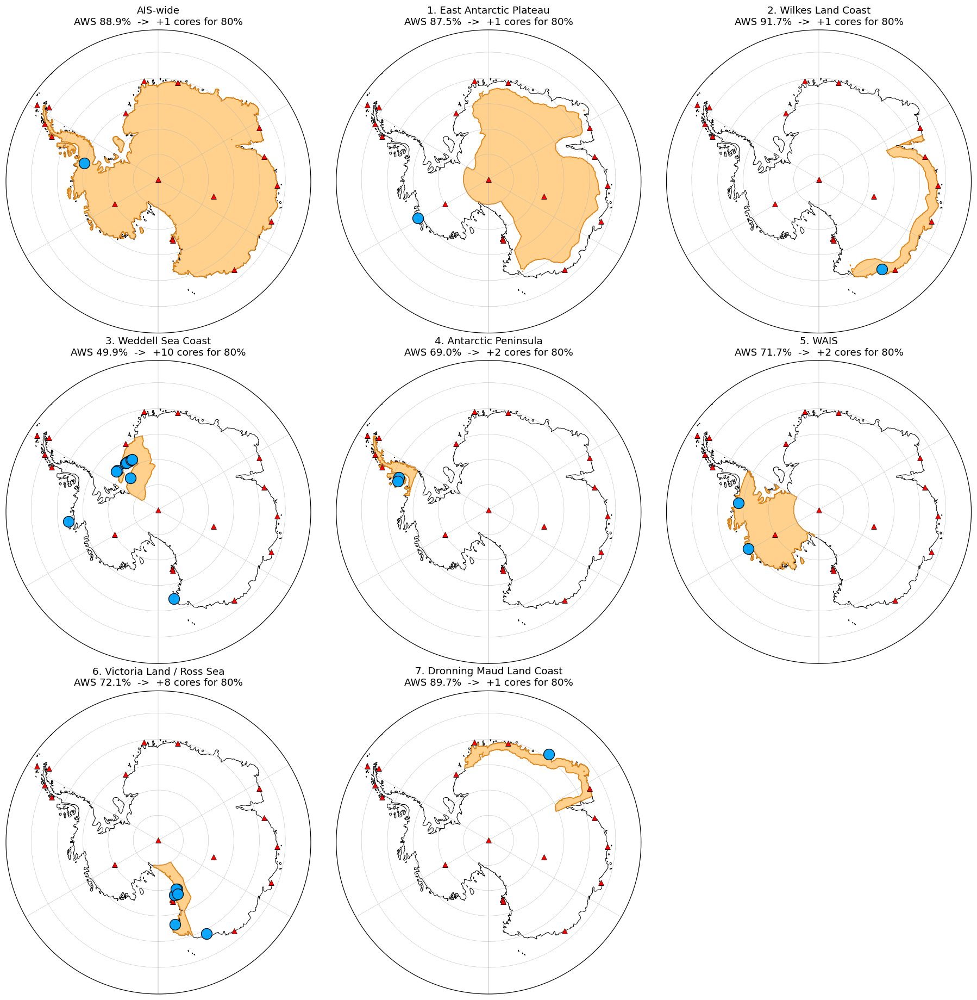

In [40]:
check_ens(); require('METS', 'fill_region', 'polar_ax')
THRESH, NMAX, DOF_LIMIT = 0.80, 400, 0.50
CORE_COLOR = '#00A5FF'
DOF_MAX = int(DOF_LIMIT * (nM - 1))
print(f'threshold {100*THRESH:.0f}% of total variance, nM={nM}, DOF={nM-1}, '
      f'network capped at {DOF_MAX} observations\n')

res, rows = {}, []
for lbl, Jm, v in METS:
    ob = OptimalSensor(Jm, Ye[:N_POTENTIAL], R_ICE_CORE)
    J0m = ob.J0var
    for i in AWS_SITES:
        ob.assimilate(int(i), Rval=R_aws(i))
    base = 100 * (1 - ob.metric_variance() / J0m)
    st, cum, capped = [], [], False
    for _ in range(NMAX):
        if len(AWS_SITES) + len(st) >= DOF_MAX:
            capped = True; break
        dv = np.where(np.isfinite(ob.evaluate()), ob.evaluate(), -np.inf)
        for k in st:
            dv[k] = -np.inf
        b = int(np.argmax(dv))
        if dv[b] <= 0:
            break
        vv = ob.assimilate(b); st.append(b)
        cum.append(100 * (1 - vv / J0m))
        if cum[-1] >= 100 * THRESH:
            break
    st, cum = np.array(st), np.array(cum)
    res[lbl] = (st, cum, base, capped, v)
    hit = lambda p: (int(np.argmax(cum >= p)) + 1) if (cum >= p).any() else -1
    rows.append(dict(metric=lbl, aws_base=base, n=len(st), reached=cum[-1],
                     n80=hit(80), n85=hit(85),
                     in_region=(int(p2k_mask[v][st].sum()) if v else len(st)),
                     capped=capped,
                     dof_pct=100*(len(AWS_SITES)+len(st))/(nM-1)))
print(pd.DataFrame(rows).round(2).to_string(index=False))

fig = plt.figure(figsize=(17, 17))
for idx, (lbl, Jm, v) in enumerate(METS):
    st, cum, base, capped, _ = res[lbl]
    r_, c_ = divmod(idx, 3)
    ax = fig.add_axes([0.02 + c_*0.325, 0.68 - r_*0.325, 0.30, 0.30], projection=SP)
    polar_ax(ax)
    fill_region(ax, v)
    ax.scatter(aws_map.lon, aws_map.lat, marker='^', s=42, c='red', edgecolors='k',
               lw=.4, transform=PL, zorder=2)
    ax.scatter(site_lon[st], site_lat[st], s=170, c=CORE_COLOR, edgecolors='k',
               lw=.9, transform=PL, zorder=4, alpha=.95)
    tail = f'{100*THRESH:.0f}%' if not capped else f'DOF cap, {cum[-1]:.1f}%'
    ax.set_title(f'{lbl}\nAWS {base:.1f}%  ->  +{len(st)} cores for {tail}',
                 fontsize=12)
plt.show()


IN-REGION CANDIDATES ONLY. threshold 80% of total variance, nM=160, DOF=159, network capped at 79 observations

                     metric  available  aws_base  n  reached  hit_target  n80  n85  capped  exhausted  dof_pct
                   AIS-wide       5295     88.90  1    89.45        True    1    1   False      False    10.69
  1. East Antarctic Plateau       3677     87.54  1    87.84        True    1    1   False      False    10.69
       2. Wilkes Land Coast        183     91.69  1    92.74        True    1    1   False      False    10.69
       3. Weddell Sea Coast        272     49.90 11    80.79        True   11   -1   False      False    16.98
     4. Antarctic Peninsula         70     68.96  2    83.87        True    2   -1   False      False    11.32
                    5. WAIS        767     71.68  2    81.87        True    2   -1   False      False    11.32
6. Victoria Land / Ross Sea        145     72.11  9    80.48        True    9   -1   False      False    15.72


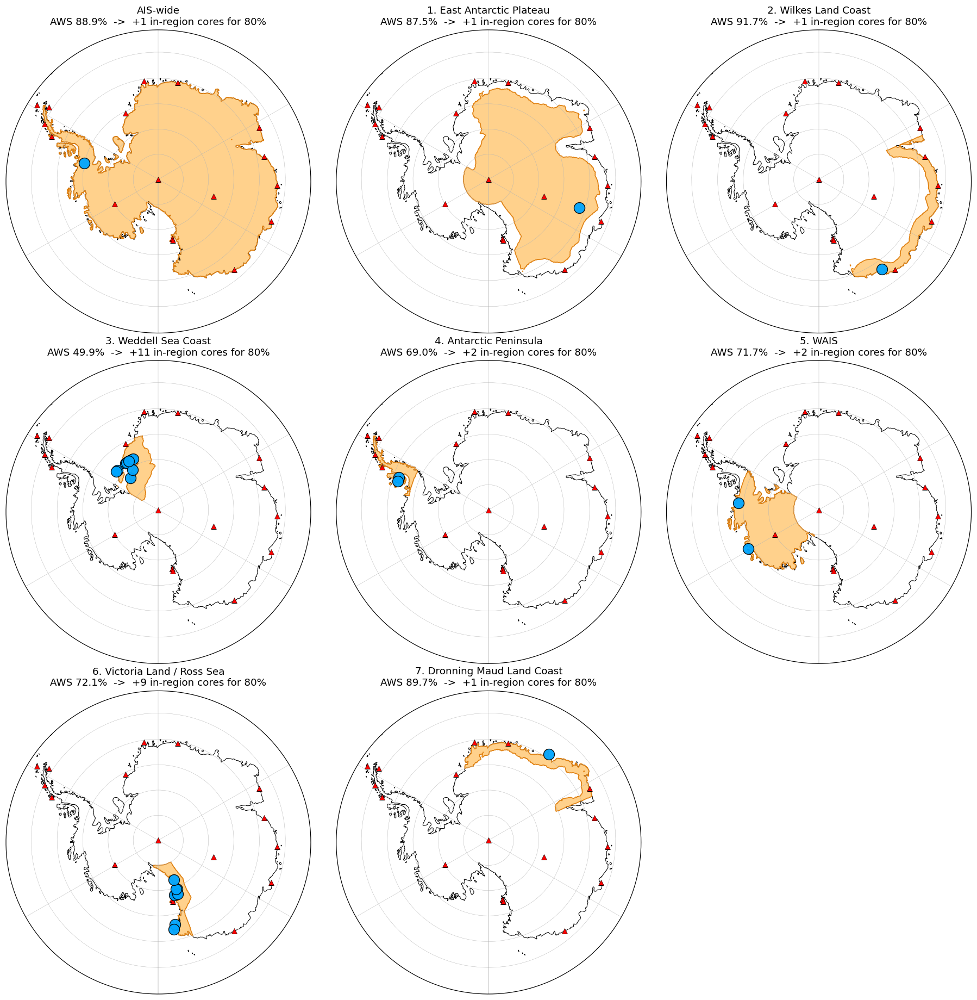

In [42]:
check_ens(); require('METS', 'fill_region', 'polar_ax')
THRESH, NMAX, DOF_LIMIT = 0.80, 400, 0.50
CORE_COLOR = '#00A5FF'
DOF_MAX = int(DOF_LIMIT * (nM - 1))
print(f'IN-REGION CANDIDATES ONLY. threshold {100*THRESH:.0f}% of total variance, '
      f'nM={nM}, DOF={nM-1}, network capped at {DOF_MAX} observations\n')

res, rows = {}, []
for lbl, Jm, v in METS:
    ok = p2k_mask[v] if v else np.ones(N_POTENTIAL, bool)   # <- the restriction
    ob = OptimalSensor(Jm, Ye[:N_POTENTIAL], R_ICE_CORE)
    J0m = ob.J0var
    for i in AWS_SITES:
        ob.assimilate(int(i), Rval=R_aws(i))
    base = 100 * (1 - ob.metric_variance() / J0m)
    st, cum, capped, exhausted = [], [], False, False
    for _ in range(NMAX):
        if len(AWS_SITES) + len(st) >= DOF_MAX:
            capped = True; break
        dv = np.where(np.isfinite(ob.evaluate()), ob.evaluate(), -np.inf)
        dv = np.where(ok, dv, -np.inf)
        for k in st:
            dv[k] = -np.inf
        b = int(np.argmax(dv))
        if not np.isfinite(dv[b]) or dv[b] <= 0:
            exhausted = True; break
        vv = ob.assimilate(b); st.append(b)
        cum.append(100 * (1 - vv / J0m))
        if cum[-1] >= 100 * THRESH:
            break
    st, cum = np.array(st), np.array(cum)
    reached = cum[-1] if len(cum) else base
    res[lbl] = (st, cum, base, capped, exhausted, v)
    hit = lambda p: (int(np.argmax(cum >= p)) + 1) if len(cum) and (cum >= p).any() else -1
    rows.append(dict(metric=lbl, available=int(ok.sum()), aws_base=base, n=len(st),
                     reached=reached, hit_target=bool(reached >= 100*THRESH),
                     n80=hit(80), n85=hit(85), capped=capped, exhausted=exhausted,
                     dof_pct=100*(len(AWS_SITES)+len(st))/(nM-1)))
print(pd.DataFrame(rows).round(2).to_string(index=False))

fig = plt.figure(figsize=(17, 17))
for idx, (lbl, Jm, v) in enumerate(METS):
    st, cum, base, capped, exhausted, _ = res[lbl]
    r_, c_ = divmod(idx, 3)
    ax = fig.add_axes([0.02 + c_*0.325, 0.68 - r_*0.325, 0.30, 0.30], projection=SP)
    polar_ax(ax)
    fill_region(ax, v)
    ax.scatter(aws_map.lon, aws_map.lat, marker='^', s=42, c='red', edgecolors='k',
               lw=.4, transform=PL, zorder=2)
    if len(st):
        ax.scatter(site_lon[st], site_lat[st], s=170, c=CORE_COLOR, edgecolors='k',
                   lw=.9, transform=PL, zorder=4, alpha=.95)
    r2 = cum[-1] if len(cum) else base
    tail = (f'{100*THRESH:.0f}%' if r2 >= 100*THRESH else
            (f'DOF cap, {r2:.1f}%' if capped else
             f'ONLY {r2:.1f}% -- region exhausted'))
    ax.set_title(f'{lbl}\nAWS {base:.1f}%  ->  +{len(st)} in-region cores for {tail}',
                 fontsize=12)
plt.show()


REDRILLING ONLY: candidates restricted to the 63 existing core cells. threshold 80% of total variance, DOF cap 79

                     metric  aws_base  n  reached  hit_target  n80  n85  exhausted  capped             first
                   AIS-wide     88.90  1    89.34        True    1    1      False   False     Siple Station
  1. East Antarctic Plateau     87.54  1    87.69        True    1    1      False   False           DML S20
       2. Wilkes Land Coast     91.69  1    91.99        True    1    1      False   False           DML S20
       3. Weddell Sea Coast     49.90 61    61.32       False   -1   -1       True   False    Berkner Island
     4. Antarctic Peninsula     68.96  3    81.32        True    3   -1      False   False             Gomez
                    5. WAIS     71.68  5    80.72        True    5   -1      False   False     Siple Station
6. Victoria Land / Ross Sea     72.11 61    75.85       False   -1   -1       True   False Whitehall Glacier
7. Dronning M

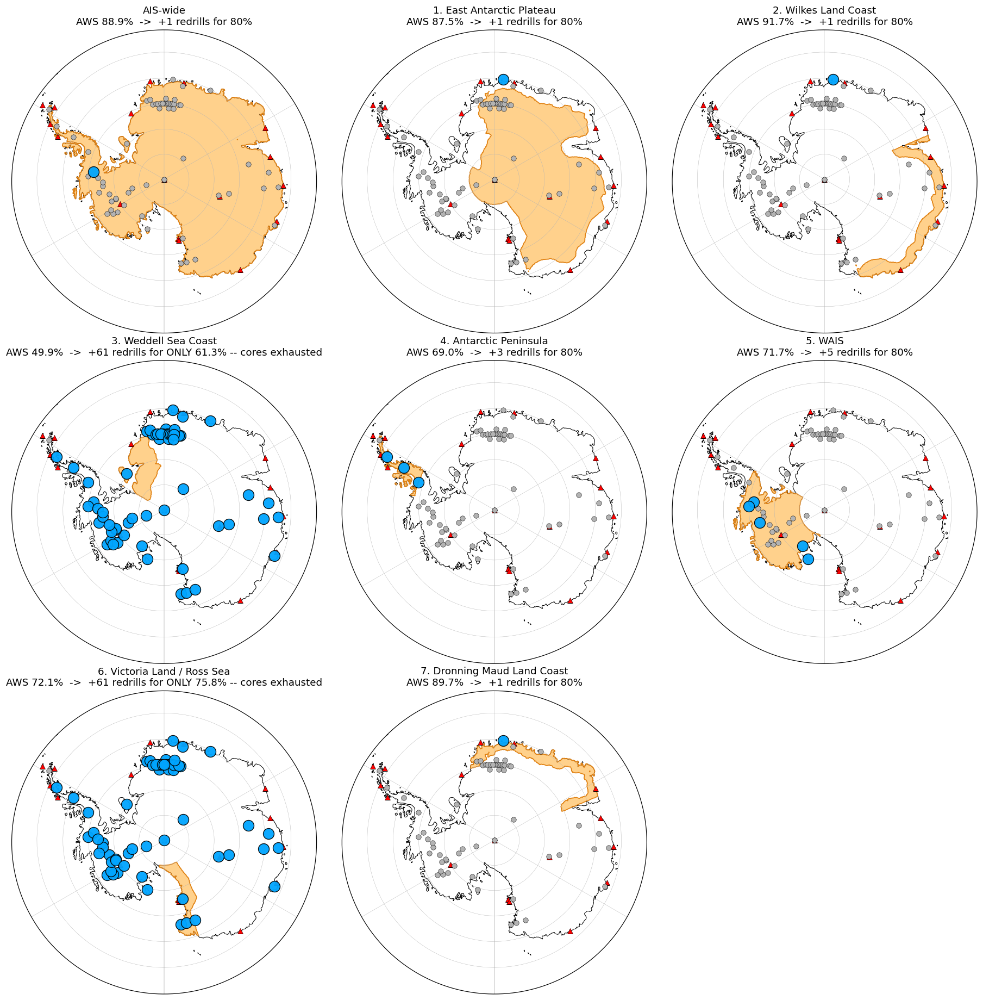

In [43]:
check_ens(); require('METS', 'fill_region', 'polar_ax', 'CORE_SITES', 'core_mask', 'name_of')
THRESH, NMAX, DOF_LIMIT = 0.80, 400, 0.50
CORE_COLOR = '#00A5FF'
DOF_MAX = int(DOF_LIMIT * (nM - 1))
print(f'REDRILLING ONLY: candidates restricted to the {len(CORE_SITES)} existing '
      f'core cells. threshold {100*THRESH:.0f}% of total variance, DOF cap {DOF_MAX}\n')

res, rows = {}, []
for lbl, Jm, v in METS:
    ob = OptimalSensor(Jm, Ye[:N_POTENTIAL], R_ICE_CORE)
    J0m = ob.J0var
    for i in AWS_SITES:
        ob.assimilate(int(i), Rval=R_aws(i))
    base = 100 * (1 - ob.metric_variance() / J0m)
    st, cum, capped, exhausted = [], [], False, False
    for _ in range(NMAX):
        if len(AWS_SITES) + len(st) >= DOF_MAX:
            capped = True; break
        dv = np.where(np.isfinite(ob.evaluate()), ob.evaluate(), -np.inf)
        dv = np.where(core_mask, dv, -np.inf)          # <- the restriction
        for k in st:
            dv[k] = -np.inf
        b = int(np.argmax(dv))
        if not np.isfinite(dv[b]) or dv[b] <= 0:
            exhausted = True; break
        vv = ob.assimilate(b); st.append(b)
        cum.append(100 * (1 - vv / J0m))
        if cum[-1] >= 100 * THRESH:
            break
    st, cum = np.array(st), np.array(cum)
    reached = cum[-1] if len(cum) else base
    res[lbl] = (st, cum, base, capped, exhausted, v)
    hit = lambda p: (int(np.argmax(cum >= p)) + 1) if len(cum) and (cum >= p).any() else -1
    rows.append(dict(metric=lbl, aws_base=base, n=len(st), reached=reached,
                     hit_target=bool(reached >= 100*THRESH), n80=hit(80), n85=hit(85),
                     exhausted=exhausted, capped=capped,
                     first=(name_of[int(st[0])] if len(st) else '-')))
print(pd.DataFrame(rows).round(2).to_string(index=False))

fig = plt.figure(figsize=(17, 17))
for idx, (lbl, Jm, v) in enumerate(METS):
    st, cum, base, capped, exhausted, _ = res[lbl]
    r_, c_ = divmod(idx, 3)
    ax = fig.add_axes([0.02 + c_*0.325, 0.68 - r_*0.325, 0.30, 0.30], projection=SP)
    polar_ax(ax)
    fill_region(ax, v)
    ax.scatter(aws_map.lon, aws_map.lat, marker='^', s=42, c='red', edgecolors='k',
               lw=.4, transform=PL, zorder=2)
    other = [k for k in CORE_SITES if k not in set(st)]
    ax.scatter(site_lon[other], site_lat[other], s=38, c='0.7', edgecolors='k',
               lw=.35, transform=PL, zorder=3)
    if len(st):
        ax.scatter(site_lon[st], site_lat[st], s=170, c=CORE_COLOR, edgecolors='k',
                   lw=.9, transform=PL, zorder=4, alpha=.95)
    r2 = cum[-1] if len(cum) else base
    tail = (f'{100*THRESH:.0f}%' if r2 >= 100*THRESH else
            (f'DOF cap, {r2:.1f}%' if capped else
             f'ONLY {r2:.1f}% -- cores exhausted'))
    ax.set_title(f'{lbl}\nAWS {base:.1f}%  ->  +{len(st)} redrills for {tail}',
                 fontsize=12)
plt.show()


HYBRID: budget fixed to the unconstrained n, redrills preferred within it.
threshold 80% of total variance, DOF cap 79

                     metric  aws_base  n  free_reached  hybrid_reached  redrills  new_sites  free_redrills
                   AIS-wide     88.90  0         88.90           88.90         0          0              0
  1. East Antarctic Plateau     87.54  0         87.54           87.54         0          0              0
       2. Wilkes Land Coast     91.69  0         91.69           91.69         0          0              0
       3. Weddell Sea Coast     49.90 10         80.20           80.17         1          9              0
     4. Antarctic Peninsula     68.96  2         83.87           82.27         1          1              0
                    5. WAIS     71.68  2         81.87           80.36         1          1              0
6. Victoria Land / Ross Sea     72.11  8         80.02           80.03         1          7              1
7. Dronning Maud Land Co

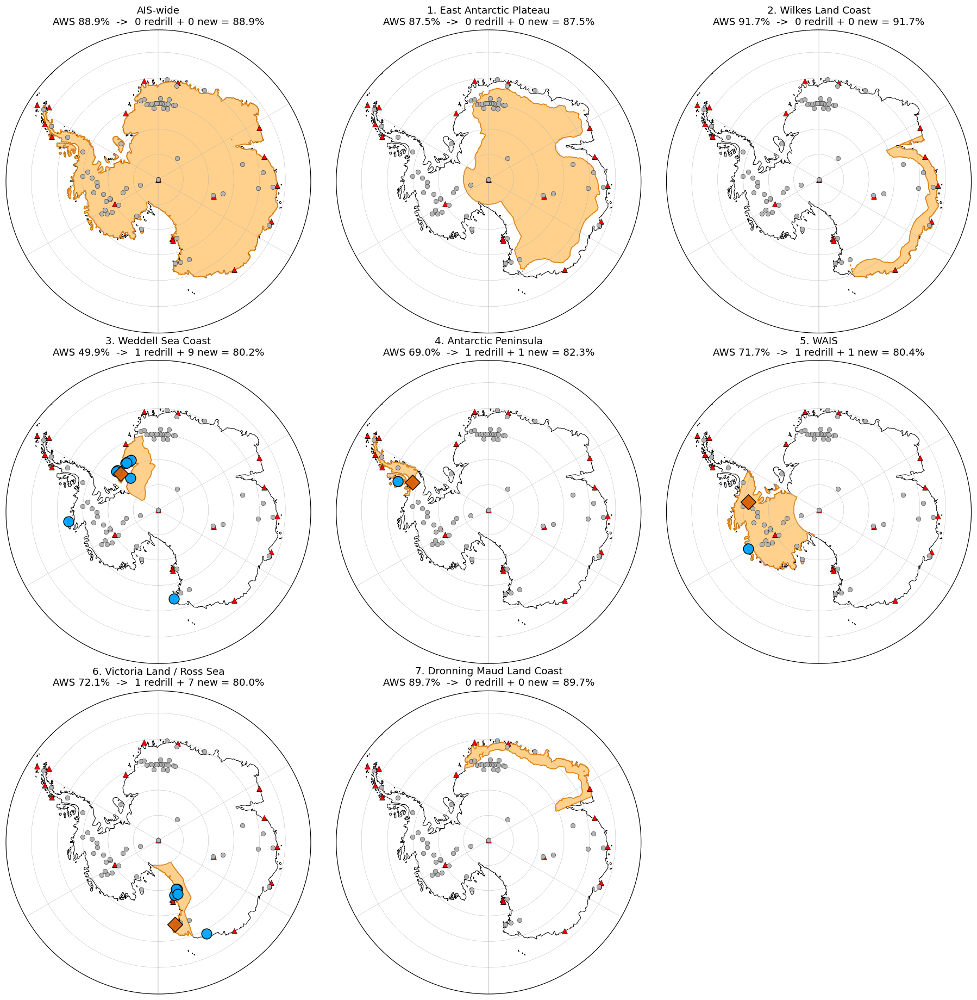


SITES TO REDRILL
                                                core    lat     lon   accum     R  cores_in_cell also
metric                      order                                                                    
3. Weddell Sea Coast        1         Berkner Island -79.63  313.75  211.76  3.67              1     
4. Antarctic Peninsula      1                  Gomez -73.98  290.00  874.92  0.89              1     
5. WAIS                     1          Siple Station -75.86  276.25  631.87  1.23              1     
6. Victoria Land / Ross Sea 1      Whitehall Glacier -73.04  168.75  457.29  1.70              1     

cores selected for more than one metric:
  (none)


In [59]:
check_ens(); require('METS', 'fill_region', 'polar_ax', 'CORE_SITES', 'core_mask', 'name_of')
import copy
THRESH, NMAX, DOF_LIMIT = 0.80, 400, 0.50
CORE_COLOR, REDRILL_COLOR = '#00A5FF', '#d95f02'
DOF_MAX = int(DOF_LIMIT * (nM - 1))
print(f'HYBRID: budget fixed to the unconstrained n, redrills preferred within it.\n'
      f'threshold {100*THRESH:.0f}% of total variance, DOF cap {DOF_MAX}\n')

def reachable(ob, J0m, budget, used):
    """Greedy lower bound on the % reachable with `budget` more FREE picks."""
    o = copy.deepcopy(ob); us = set(used)
    best = 100 * (1 - o.metric_variance() / J0m)
    for _ in range(budget):
        dv = np.where(np.isfinite(o.evaluate()), o.evaluate(), -np.inf)
        for k in us:
            dv[k] = -np.inf
        b = int(np.argmax(dv))
        if not np.isfinite(dv[b]) or dv[b] <= 0:
            break
        best = 100 * (1 - o.assimilate(b) / J0m); us.add(b)
    return best

res, rows = {}, []
for lbl, Jm, v in METS:
    ob = OptimalSensor(Jm, Ye[:N_POTENTIAL], R_ICE_CORE)
    J0m = ob.J0var
    for i in AWS_SITES:
        ob.assimilate(int(i), Rval=R_aws(i))
    base = 100 * (1 - ob.metric_variance() / J0m)

    # --- 1) unconstrained run: sets the budget ---
    free, st_f = copy.deepcopy(ob), []
    for _ in range(0 if base >= 100*THRESH else NMAX):
        if len(AWS_SITES) + len(st_f) >= DOF_MAX:
            break
        dv = np.where(np.isfinite(free.evaluate()), free.evaluate(), -np.inf)
        for k in st_f:
            dv[k] = -np.inf
        b = int(np.argmax(dv))
        if dv[b] <= 0:
            break
        vv = free.assimilate(b); st_f.append(b)
        if 100 * (1 - vv / J0m) >= 100 * THRESH:
            break
    n_free = len(st_f)
    reach_free = 100 * (1 - free.metric_variance() / J0m)

    # --- 2) hybrid: same budget, redrill whenever it stays feasible ---
    hy, st_h, kinds = copy.deepcopy(ob), [], []
    for step in range(n_free):
        left = n_free - step - 1
        dvc = np.where(np.isfinite(hy.evaluate()), hy.evaluate(), -np.inf)
        dvc = np.where(core_mask, dvc, -np.inf)
        for k in st_h:
            dvc[k] = -np.inf
        bc = int(np.argmax(dvc)); took = None
        if np.isfinite(dvc[bc]) and dvc[bc] > 0:
            trial = copy.deepcopy(hy); trial.assimilate(bc)
            if reachable(trial, J0m, left, set(st_h) | {bc}) >= 100*THRESH - 1e-9:
                took = bc; kinds.append('redrill')
        if took is None:
            dv = np.where(np.isfinite(hy.evaluate()), hy.evaluate(), -np.inf)
            for k in st_h:
                dv[k] = -np.inf
            took = int(np.argmax(dv)); kinds.append('new')
        hy.assimilate(took); st_h.append(took)
    st_h = np.array(st_h, int)
    reach_h = 100 * (1 - hy.metric_variance() / J0m) if n_free else base
    res[lbl] = (st_h, kinds, base, reach_h, v)
    rows.append(dict(metric=lbl, aws_base=base, n=n_free, free_reached=reach_free,
                     hybrid_reached=reach_h, redrills=kinds.count('redrill'),
                     new_sites=kinds.count('new'),
                     free_redrills=int(core_mask[st_f].sum()) if n_free else 0))
print(pd.DataFrame(rows).round(2).to_string(index=False))

fig = plt.figure(figsize=(17, 17))
for idx, (lbl, Jm, v) in enumerate(METS):
    st_h, kinds, base, reach_h, _ = res[lbl]
    r_, c_ = divmod(idx, 3)
    ax = fig.add_axes([0.02 + c_*0.325, 0.68 - r_*0.325, 0.30, 0.30], projection=SP)
    polar_ax(ax); fill_region(ax, v)
    ax.scatter(aws_map.lon, aws_map.lat, marker='^', s=42, c='red', edgecolors='k',
               lw=.4, transform=PL, zorder=2)
    ax.scatter(site_lon[CORE_SITES], site_lat[CORE_SITES], s=30, c='0.7',
               edgecolors='k', lw=.3, transform=PL, zorder=3)
    if len(st_h):
        kk = np.array(kinds)
        for sel, col, mk, sz in [(kk == 'new', CORE_COLOR, 'o', 150),
                                 (kk == 'redrill', REDRILL_COLOR, 'D', 165)]:
            if sel.any():
                ax.scatter(site_lon[st_h[sel]], site_lat[st_h[sel]], s=sz, c=col,
                           marker=mk, edgecolors='k', lw=1.0, transform=PL,
                           zorder=4, alpha=.95)
    ax.set_title(f'{lbl}\nAWS {base:.1f}%  ->  {kinds.count("redrill")} redrill + '
                 f'{kinds.count("new")} new = {reach_h:.1f}%', fontsize=12)
plt.show()

print('\n' + '='*74)
print('SITES TO REDRILL')
print('='*74)
det = []
for lbl, Jm, v in METS:
    st_h, kinds, base, reach_h, _ = res[lbl]
    for o, (k, kind) in enumerate(zip(st_h, kinds), 1):
        if kind != 'redrill':
            continue
        nm = name_of.get(int(k), '?')
        alts = sorted({n for s_, n in zip(cc.site, cc.name) if int(s_) == int(k)})
        det.append(dict(metric=lbl, order=o, core=nm,
                        lat=site_lat[k], lon=site_lon[k],
                        accum=accum_rate[k], R=R_ICE_CORE[k],
                        cores_in_cell=len(alts),
                        also='; '.join(a for a in alts if a != nm)[:38]))
D = pd.DataFrame(det)
if len(D):
    print(D.set_index(['metric', 'order']).round(2).to_string())
    vc = D.core.value_counts()
    print('\ncores selected for more than one metric:')
    if (vc > 1).any():
        for nm, c in vc[vc > 1].items():
            print(f'  {nm:22s} {c} metrics: ' + ', '.join(D[D.core == nm].metric))
    else:
        print('  (none)')
else:
    print('no redrills selected')



--- after EXISTING CORE assimilation: one new ICE CORE, R = k/A ---
                     metric  core_base  max_add    lat    lon   accum    R  in_region  mean_add
                   AIS-wide      67.22     4.25 -68.32  68.75  620.09 1.25       True      0.47
  1. East Antarctic Plateau      58.48     4.16 -68.32  68.75  620.09 1.25      False      0.56
       2. Wilkes Land Coast      66.28     6.73 -67.38 127.50 1124.08 0.69       True      0.50
       3. Weddell Sea Coast      40.68    11.34 -78.69 313.75  321.94 2.41       True      0.44
     4. Antarctic Peninsula      78.50     6.25 -71.15 287.50  980.93 0.79       True      0.30
                    5. WAIS      84.03     2.22 -73.98 241.25 1148.44 0.68       True      0.12
6. Victoria Land / Ross Sea      37.92     7.76 -78.69 162.50  295.38 2.63       True      0.39
7. Dronning Maud Land Coast      64.64     6.77 -68.32  70.00  708.61 1.10      False      0.36


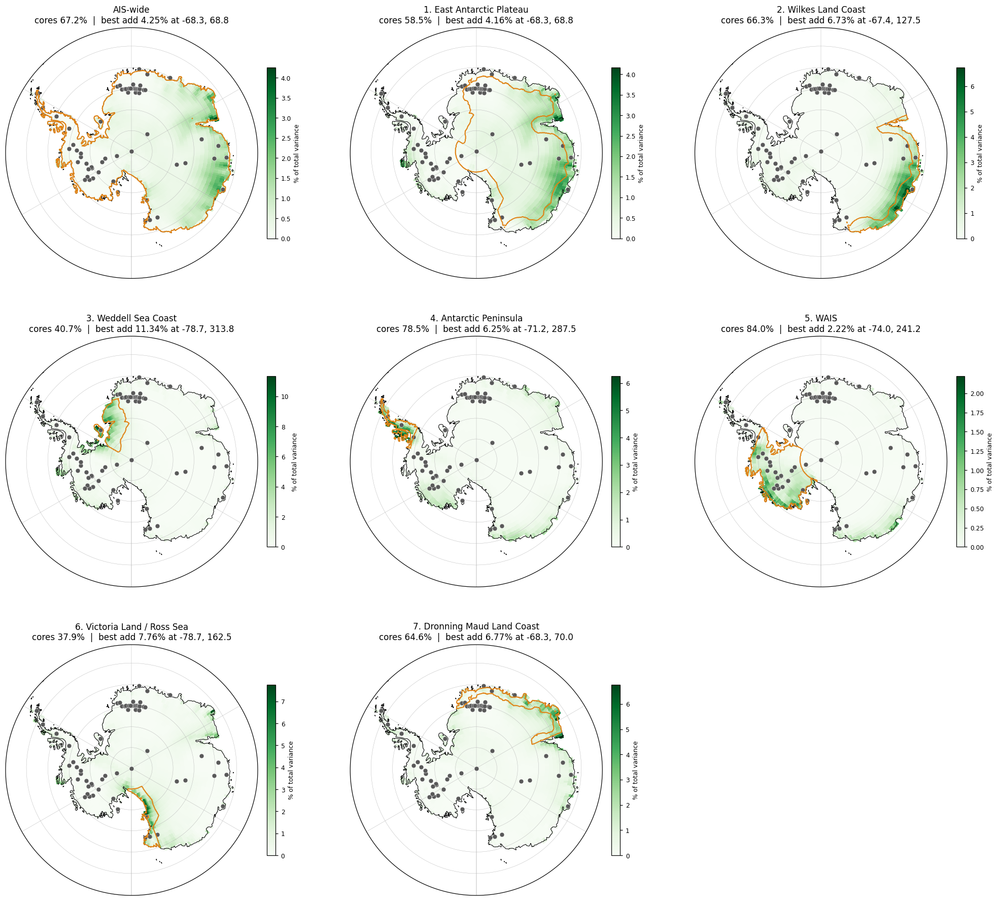

In [44]:
check_ens(); require('outline_region', 'field_map', 'METS', 'CORE_SITES')

def post_core_panels(Rcand, label):
    """The 63 EXISTING water-isotope core cells are assimilated first, each at
    its own R_ICE_CORE, then one candidate observation is scored at each grid
    cell. Values are percentage points of the metric's TOTAL variance."""
    fig = plt.figure(figsize=(19, 17)); rows = []
    for idx, (lbl, Jm, v) in enumerate(METS):
        ob = OptimalSensor(Jm, Ye[:N_POTENTIAL], Rcand)
        J0m = ob.J0var
        for i in CORE_SITES:
            ob.assimilate(int(i), Rval=float(R_ICE_CORE[i]))
        base = 100 * (1 - ob.metric_variance() / J0m)
        p = 100 * np.where(np.isfinite(ob.evaluate()), ob.evaluate(), np.nan) / J0m
        k = int(np.nanargmax(p))
        r_, c_ = divmod(idx, 3)
        ax = fig.add_axes([0.02 + c_*0.325, 0.68 - r_*0.325, 0.29, 0.29],
                          projection=SP)
        sc = field_map(p, f'{lbl}\ncores {base:.1f}%  |  best add {p[k]:.2f}% at '
                          f'{site_lat[k]:.1f}, {site_lon[k]:.1f}',
                       ax=ax, fig=fig, cb=False, fs=11)
        ax.scatter(site_lon[CORE_SITES], site_lat[CORE_SITES], s=34, c='0.35',
                   edgecolors='w', lw=.35, transform=PL, zorder=3)
        outline_region(ax, v)
        cb = fig.colorbar(sc, ax=ax, shrink=.62, pad=.03)
        cb.ax.tick_params(labelsize=8)
        cb.set_label('% of total variance', fontsize=8)
        rows.append(dict(metric=lbl, core_base=base, max_add=p[k],
                         lat=site_lat[k], lon=site_lon[k], accum=accum_rate[k],
                         R=(Rcand[k] if np.ndim(Rcand) else Rcand),
                         in_region=(bool(p2k_mask[v][k]) if v else True),
                         mean_add=np.nansum(p*wts)/wts.sum()))
    print(f'--- {label} ---')
    print(pd.DataFrame(rows).round(2).to_string(index=False))
    plt.show()

post_core_panels(R_ICE_CORE,
                 'after EXISTING CORE assimilation: one new ICE CORE, R = k/A')


PRE-ASSIMILATED: the 63 existing core cells. threshold 80% of total variance, nM=160, DOF=159, network capped at 79 observations

                     metric  core_base  n  reached  n70  n75  in_region  capped  dof_pct
                   AIS-wide      67.22  8    80.59    1    3          8   False    44.65
  1. East Antarctic Plateau      58.48 16    78.27    5   10          4    True    49.69
       2. Wilkes Land Coast      66.28  4    81.64    1    2          4   False    42.14
       3. Weddell Sea Coast      40.68 13    80.80    6    8         10   False    47.80
     4. Antarctic Peninsula      78.50  1    84.75    1    1          1   False    40.25
                    5. WAIS      84.03  1    86.25    1    1          1   False    40.25
6. Victoria Land / Ross Sea      37.92 16    78.50    9   12         12    True    49.69
7. Dronning Maud Land Coast      64.64  5    80.86    1    2          3   False    42.77


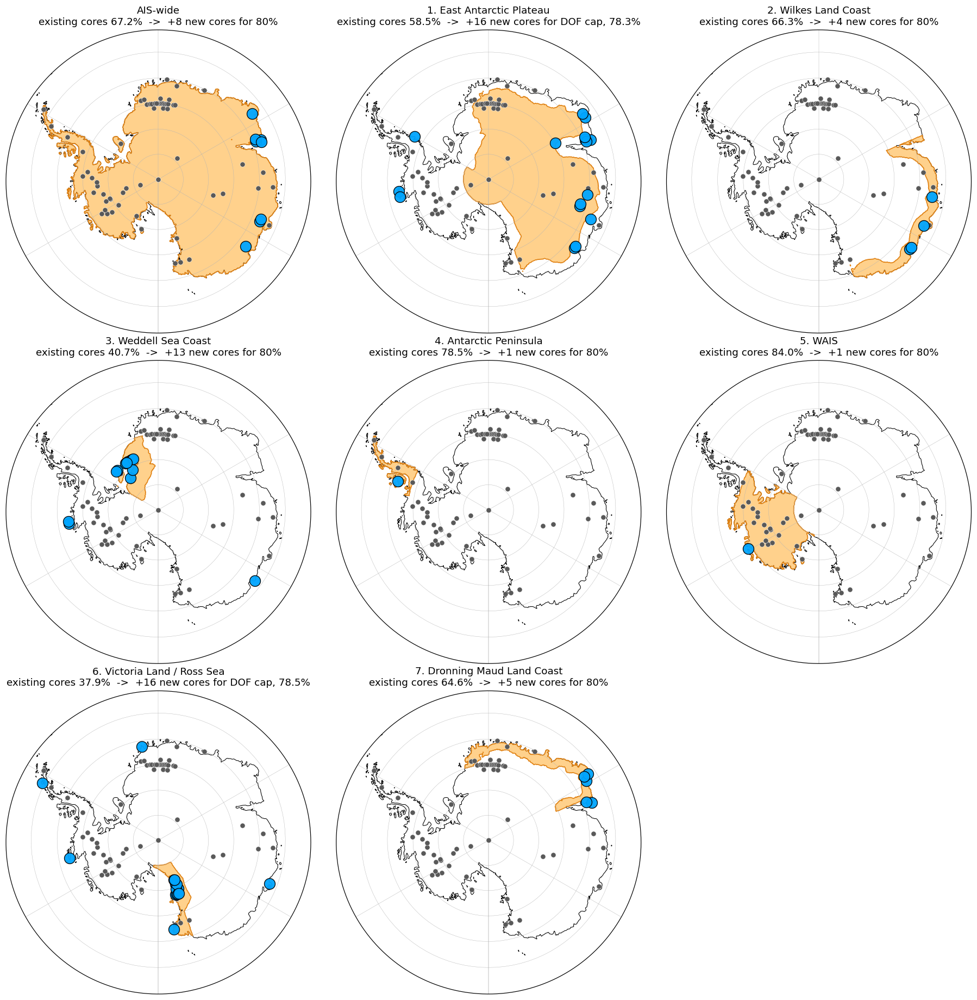

In [61]:
check_ens(); require('METS', 'fill_region', 'polar_ax', 'CORE_SITES')
THRESH, NMAX, DOF_LIMIT = 0.80, 400, 0.50
CORE_COLOR = '#00A5FF'
DOF_MAX = int(DOF_LIMIT * (nM - 1))
print(f'PRE-ASSIMILATED: the {len(CORE_SITES)} existing core cells. '
      f'threshold {100*THRESH:.0f}% of total variance, nM={nM}, DOF={nM-1}, '
      f'network capped at {DOF_MAX} observations\n')

res, rows = {}, []
for lbl, Jm, v in METS:
    ob = OptimalSensor(Jm, Ye[:N_POTENTIAL], R_ICE_CORE)
    J0m = ob.J0var
    for i in CORE_SITES:
        ob.assimilate(int(i), Rval=float(R_ICE_CORE[i]))
    base = 100 * (1 - ob.metric_variance() / J0m)
    st, cum, capped = [], [], False
    for _ in range(NMAX):
        if len(CORE_SITES) + len(st) >= DOF_MAX:
            capped = True; break
        dv = np.where(np.isfinite(ob.evaluate()), ob.evaluate(), -np.inf)
        for k in st:
            dv[k] = -np.inf
        b = int(np.argmax(dv))
        if dv[b] <= 0:
            break
        vv = ob.assimilate(b); st.append(b)
        cum.append(100 * (1 - vv / J0m))
        if cum[-1] >= 100 * THRESH:
            break
    st, cum = np.array(st), np.array(cum)
    res[lbl] = (st, cum, base, capped, v)
    hit = lambda p: (int(np.argmax(cum >= p)) + 1) if len(cum) and (cum >= p).any() else -1
    rows.append(dict(metric=lbl, core_base=base, n=len(st),
                     reached=(cum[-1] if len(cum) else base),
                     n70=hit(70), n75=hit(75),
                     in_region=(int(p2k_mask[v][st].sum()) if v else len(st)),
                     capped=capped,
                     dof_pct=100*(len(CORE_SITES)+len(st))/(nM-1)))
print(pd.DataFrame(rows).round(2).to_string(index=False))

fig = plt.figure(figsize=(17, 17))
for idx, (lbl, Jm, v) in enumerate(METS):
    st, cum, base, capped, _ = res[lbl]
    r_, c_ = divmod(idx, 3)
    ax = fig.add_axes([0.02 + c_*0.325, 0.68 - r_*0.325, 0.30, 0.30], projection=SP)
    polar_ax(ax)
    fill_region(ax, v)
    ax.scatter(site_lon[CORE_SITES], site_lat[CORE_SITES], s=36, c='0.35',
               edgecolors='w', lw=.35, transform=PL, zorder=2)
    if len(st):
        ax.scatter(site_lon[st], site_lat[st], s=170, c=CORE_COLOR, edgecolors='k',
                   lw=.9, transform=PL, zorder=4, alpha=.95)
    r2 = cum[-1] if len(cum) else base
    tail = f'{100*THRESH:.0f}%' if not capped else f'DOF cap, {r2:.1f}%'
    ax.set_title(f'{lbl}\nexisting cores {base:.1f}%  ->  +{len(st)} new cores '
                 f'for {tail}', fontsize=12)
plt.show()


total area-weighted variance 0.7818 K^2 | rank 160
effective spatial DOF (participation ratio) 4.37
  EOF1:  44.01%   cumulative  44.01%
  EOF2:  11.50%   cumulative  55.50%
  EOF3:  10.95%   cumulative  66.45%
  EOF4:   6.17%   cumulative  72.62%
  EOF5:   5.02%   cumulative  77.64%
  EOF6:   3.98%   cumulative  81.62%
  EOF7:   2.67%   cumulative  84.28%
  EOF8:   2.04%   cumulative  86.32%
  modes for 50%: 2
  modes for 80%: 6
  modes for 90%: 11
  modes for 95%: 18

North separation test:
  1->2: gap 32.51%  err  4.92%  separated
  2->3: gap  0.54%  err  1.29%  DEGENERATE
  3->4: gap  4.79%  err  1.22%  separated
  4->5: gap  1.15%  err  0.69%  separated
  5->6: gap  1.04%  err  0.56%  separated

correlation of each PC with the metrics:
      AIS  Plateau  Wilkes  Weddell  Peninsula  WAIS  Vic.Land   DML
PC1 -0.99    -0.99   -0.88    -0.44       0.06 -0.51     -0.66 -0.85
PC2  0.14    -0.08   -0.23     0.40       0.40  0.70      0.33  0.16
PC3 -0.02    -0.12    0.19    -0.61      -

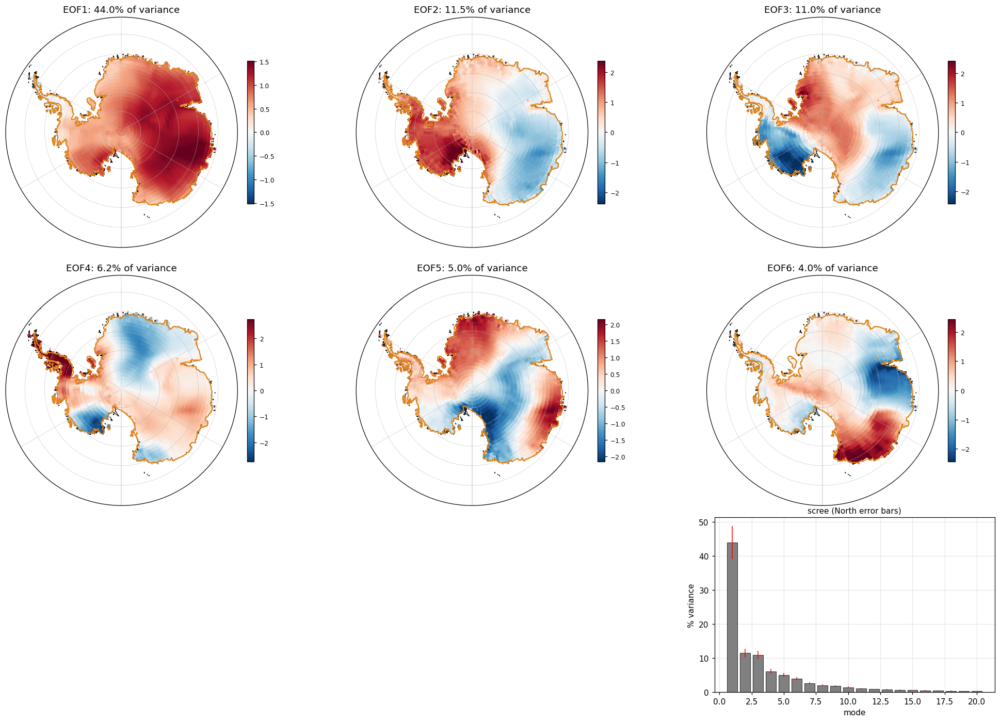

In [48]:
check_ens(); require('to_grid', 'polar_ax', 'outline_region')
NEOF = 6

# EOFs of the ENSEMBLE spread, not of a time series: the sample dimension is
# the 160 (deblocked) MRE members. This is exactly the covariance the optimal
# sensor exploits, so the modes here are what the algorithm is "seeing".
Yd = Ye[:N_POTENTIAL] - Ye[:N_POTENTIAL].mean(1, keepdims=True)
w  = wts / wts.sum()                       # cos(lat) area weights
A  = np.sqrt(w)[:, None] * Yd              # weight so the SVD optimises area-mean variance
U, S, Vt = np.linalg.svd(A, full_matrices=False)

lam  = S**2 * unbias
frac = lam / lam.sum(); cum = np.cumsum(frac)
EOF  = U / np.sqrt(w)[:, None]             # un-weight for display (K per unit PC)
PC   = S[:, None] * Vt                     # amplitude of each mode per member
dl   = lam * np.sqrt(2/nM)                 # North et al. (1982) sampling error

print(f'total area-weighted variance {lam.sum():.4f} K^2 | rank {len(lam)}')
print(f'effective spatial DOF (participation ratio) {1/(frac**2).sum():.2f}')
for i in range(8):
    print(f'  EOF{i+1}: {100*frac[i]:6.2f}%   cumulative {100*cum[i]:6.2f}%')
for p in (0.5, 0.8, 0.9, 0.95):
    print(f'  modes for {100*p:.0f}%: {int(np.searchsorted(cum, p) + 1)}')

print('\nNorth separation test:')
for i in range(5):
    sep = (lam[i] - lam[i+1]) > dl[i]
    print(f'  {i+1}->{i+2}: gap {100*(frac[i]-frac[i+1]):5.2f}%  err '
          f'{100*dl[i]/lam.sum():5.2f}%  {"separated" if sep else "DEGENERATE"}')

SHORT8 = ['AIS', 'Plateau', 'Wilkes', 'Weddell', 'Peninsula', 'WAIS', 'Vic.Land', 'DML']
Js = [J - J.mean()] + [(lambda x: x - x.mean())(build_metric(Ye, mask=p2k_mask[v]))
                       for v in range(1, 8)]
print('\ncorrelation of each PC with the metrics:')
print(pd.DataFrame([[np.corrcoef(PC[i], x)[0, 1] for x in Js] for i in range(NEOF)],
                   columns=SHORT8,
                   index=[f'PC{i+1}' for i in range(NEOF)]).round(2).to_string())

fig = plt.figure(figsize=(19, 14))
for i in range(NEOF):
    r_, c_ = divmod(i, 3)
    ax = fig.add_axes([0.02 + c_*0.325, 0.66 - r_*0.325, 0.29, 0.29], projection=SP)
    polar_ax(ax)
    e = EOF[:, i]
    if (e*wts).sum() < 0:                  # sign convention: positive area mean
        e = -e
    lim = np.nanpercentile(np.abs(e), 99)
    sc = ax.pcolormesh(LON_E, LAT_E, np.ma.masked_invalid(to_grid(e)), cmap='RdBu_r',
                       vmin=-lim, vmax=lim, transform=PL, zorder=1, shading='flat')
    outline_region(ax, 0)
    cb = fig.colorbar(sc, ax=ax, shrink=.62, pad=.03); cb.ax.tick_params(labelsize=8)
    ax.set_title(f'EOF{i+1}: {100*frac[i]:.1f}% of variance', fontsize=12)

ax = fig.add_axes([0.70, 0.10, 0.26, 0.22])
ax.bar(np.arange(1, 21), 100*frac[:20], color='0.5', edgecolor='k', lw=.5)
ax.errorbar(np.arange(1, 21), 100*frac[:20], yerr=100*dl[:20]/lam.sum(),
            fmt='none', ecolor='r', lw=1)
ax.set_xlabel('mode'); ax.set_ylabel('% variance')
ax.set_title('scree (North error bars)', fontsize=10)
ax.grid(alpha=.3); ax.set_axisbelow(True)
plt.show()


grid-adjacency graph: 6 components, sizes [np.int64(5271), np.int64(15), np.int64(4), np.int64(3), np.int64(1), np.int64(1)]
EOFs 2-8 (42.3% of variance), contiguous=True, n=6 -> 11 spatial pieces

 cluster  cells  area_pct  pieces   var  mean_corr  pc1_pct  modes_for_90  accum_med
       1   1855    13.989       2 0.494      0.843   71.789             4     51.762
       2    892    20.915       1 0.415      0.823   69.862             4     40.089
       3    757    17.219       3 0.504      0.741   58.634             5    214.589
       4    593    18.827       1 0.581      0.869   76.596             4     71.645
       5    515    19.300       1 0.632      0.831   73.821             4    126.739
       6    683     9.750       3 0.470      0.846   73.870             4    110.940

mean within-cluster coherence 0.825 (Ant-2K = 0.802)
agreement with Ant-2K (adjusted Rand) = 0.229


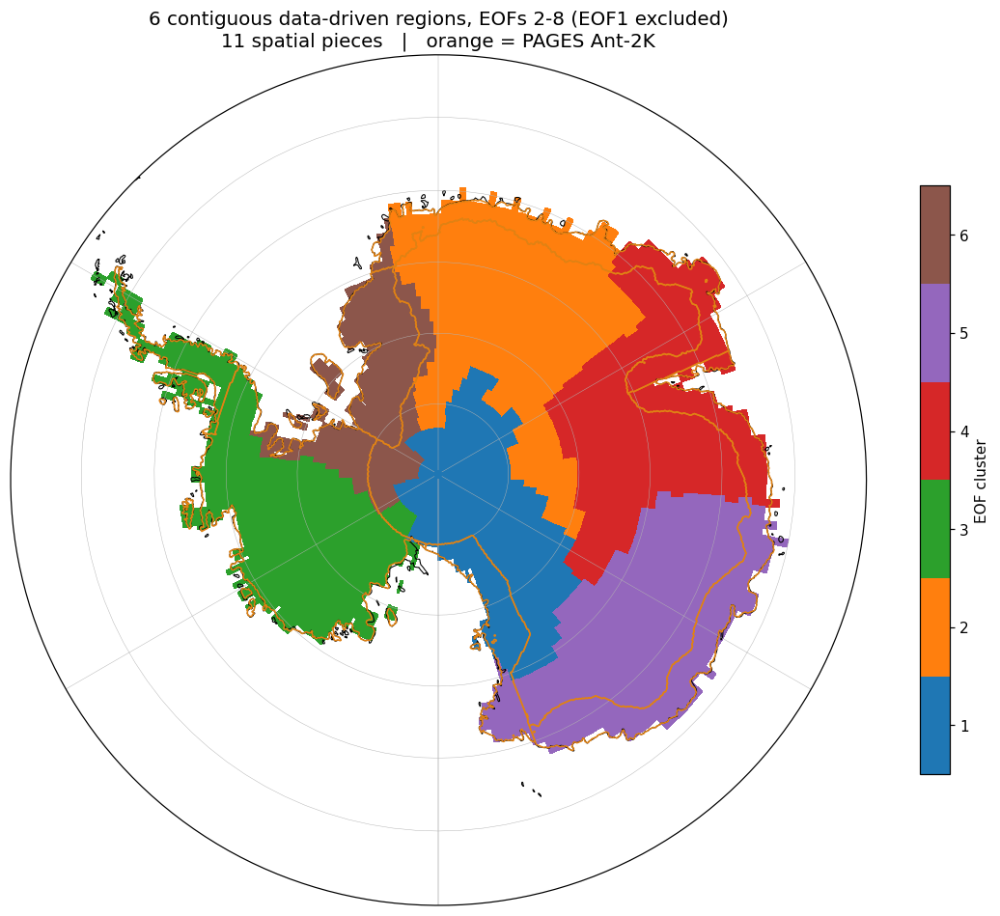

In [57]:
check_ens(); require('EOF', 'lam', 'frac', 'to_grid', 'outline_region')
import matplotlib.colors as mcolors, scipy.sparse as sp
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.metrics import adjusted_rand_score
from scipy.sparse.csgraph import connected_components

# ---- toggles ----------------------------------------------------------
N_REG     = 6        # number of data-driven regions
K_USE     = 8        # use EOFs up to this index
DROP_EOF1 = True     # exclude the continent-wide mode
NORMALIZE = True     # cluster on pattern, not amplitude
CONTIGUOUS = True    # enforce spatial contiguity
SEED      = 0
# -----------------------------------------------------------------------

Yd   = Ye[:N_POTENTIAL] - Ye[:N_POTENTIAL].mean(1, keepdims=True)
varj = unbias * (Yd**2).sum(1)
i0 = 1 if DROP_EOF1 else 0
F  = EOF[:, i0:K_USE] * np.sqrt(lam[i0:K_USE])[None, :]
if NORMALIZE:
    F = F / np.maximum(np.linalg.norm(F, axis=1, keepdims=True), 1e-12)

# --- grid adjacency on the native CCSM4 grid (8-connected, wraps in lon) ---
_gi = np.searchsorted(ccsm_lat[:32], site_lat)
_gj = (np.round(site_lon/1.25).astype(int)) % 288
_idx = -np.ones((32, 288), int); _idx[_gi, _gj] = np.arange(N_POTENTIAL)
_r, _c = [], []
for di in (-1, 0, 1):
    for dj in (-1, 0, 1):
        if di == 0 and dj == 0:
            continue
        a = _idx
        b = np.roll(np.roll(_idx, -di, axis=0), -dj, axis=1)
        if di != 0:
            b[(0 if di < 0 else -1), :] = -1        # no wrap across the pole/edge
        ok2 = (a >= 0) & (b >= 0)
        _r.append(a[ok2]); _c.append(b[ok2])
_r, _c = np.concatenate(_r), np.concatenate(_c)
G = sp.coo_matrix((np.ones(len(_r)), (_r, _c)),
                  shape=(N_POTENTIAL, N_POTENTIAL)).tocsr()
G = ((G + G.T) > 0).astype(int)

def pieces(L):
    return sum(connected_components(G[L == c][:, L == c], directed=False)[0]
               for c in np.unique(L))

_ncomp, _lg = connected_components(G, directed=False)
print(f'grid-adjacency graph: {_ncomp} components, sizes '
      f'{sorted(np.bincount(_lg))[::-1]}')

if CONTIGUOUS:
    labs = AgglomerativeClustering(n_clusters=N_REG, connectivity=G,
                                   linkage='ward').fit(F).labels_ + 1
else:
    labs = KMeans(n_clusters=N_REG, n_init=25, random_state=SEED).fit(F).labels_ + 1

kept = 100 * (cum[K_USE-1] - (frac[0] if DROP_EOF1 else 0))
print(f'EOFs {i0+1}-{K_USE} ({kept:.1f}% of variance), contiguous={CONTIGUOUS}, '
      f'n={N_REG} -> {pieces(labs)} spatial pieces\n')

rows = []
for c in range(1, N_REG+1):
    m  = labs == c
    Jc = build_metric(Ye, mask=m); Jd = Jc - Jc.mean()
    Jv = unbias * (Jd**2).sum()
    wc = wts[m] / wts[m].sum()
    r  = (unbias * (Yd[m] @ Jd)) / np.sqrt(varj[m] * Jv)
    Ac = np.sqrt(wc)[:, None] * Yd[m]
    ec = np.linalg.svd(Ac, compute_uv=False)**2; ec = ec/ec.sum()
    npc = connected_components(G[m][:, m], directed=False)[0]
    rows.append(dict(cluster=c, cells=int(m.sum()),
                     area_pct=100*wts[m].sum()/wts.sum(), pieces=npc, var=Jv,
                     mean_corr=float((wc*r).sum()), pc1_pct=100*ec[0],
                     modes_for_90=int(np.searchsorted(np.cumsum(ec), .9) + 1),
                     accum_med=float(np.median(accum_rate[m]))))
dfc = pd.DataFrame(rows)
print(dfc.round(3).to_string(index=False))

p2k = np.zeros(N_POTENTIAL, int)
for v in range(1, 8):
    p2k[p2k_mask[v]] = v
ok = p2k > 0
print(f'\nmean within-cluster coherence {dfc.mean_corr.mean():.3f} '
      f'(Ant-2K = 0.802)')
print(f'agreement with Ant-2K (adjusted Rand) = '
      f'{adjusted_rand_score(p2k[ok], labs[ok]):.3f}')

fig = plt.figure(figsize=(13, 12)); ax = plt.axes(projection=SP)
polar_ax(ax)
cmap = mcolors.ListedColormap(plt.cm.tab10(np.arange(N_REG)))
sc = ax.pcolormesh(LON_E, LAT_E, np.ma.masked_invalid(to_grid(labs.astype(float))),
                   cmap=cmap, vmin=.5, vmax=N_REG+.5, transform=PL, zorder=1,
                   shading='flat')
for v in range(1, 8):
    outline_region(ax, v, lw=1.0)
cb = fig.colorbar(sc, ax=ax, shrink=.6, pad=.05, ticks=np.arange(1, N_REG+1))
cb.set_label('EOF cluster')
ax.set_title(f'{N_REG} contiguous data-driven regions, EOFs {i0+1}-{K_USE} '
             f'(EOF1 excluded)\n{pieces(labs)} spatial pieces   |   '
             f'orange = PAGES Ant-2K', fontsize=13)
plt.show()

eof_mask = {c: (labs == c) for c in range(1, N_REG+1)}
